## Capstone Project

**Research title:** 

Application of Machine Learning algorithms to evaluate the changes in energy consumption in the Leinster area and subsequently the impact on consumer behaviour in the commercial sector.  

**Datasets used:**

- Meter readings for Non Residential Customers (Ireland).

- Meter readings for Residential Customers (Ireland).

- Meter readings for All Metered Customers (Ireland).

This notebook is divided into the following parts: 

#### EDA Analysis

#### Experiments with different machine learning models for regression to analyse the following:

- Building a linear regression model without cross-validation
- Cross-validation:  K-fold CV and Hyperparameter tuning using CV
- DTR and Ensemble models RFR and GBR.
- Finding Important Features in Scikit-learn
- SVR and ANN
- Polynomial Features

#### Final Model Building and Evaluation


## 1. EDA Analysis

All the different stages of EDA analysis are going to be covered

## **1.1. Data Cleaning**

In [1]:
#Import the libraries

import matplotlib
matplotlib.use("TkAgg")
import pandas as pd
import seaborn as sns
import numpy as np
from keras.datasets import reuters
from keras.preprocessing.text import Tokenizer
from keras import models
from keras import layers
from matplotlib import pyplot as plt
import matplotlib.pyplot as plt 
from scipy.stats.mstats import winsorize # winsorization of outliers
%matplotlib inLine
sns.set(color_codes=True) 

import sklearn
from sklearn.feature_selection import RFE
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error,explained_variance_score
from sklearn.linear_model import LinearRegression,Ridge,Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import (GridSearchCV, cross_val_score, cross_val_predict, StratifiedKFold, learning_curve)
from statsmodels.tools.eval_measures import mse, rmse
from sklearn import preprocessing
from sklearn.pipeline import make_pipeline

#Libraries for Artificial Neural Networks
from tensorflow.keras import Model
from tensorflow.keras import Sequential
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.layers import Dense, Dropout
from sklearn.model_selection import train_test_split

#LIME Analysis
from lime.lime_tabular import LimeTabularExplainer
import lime
import lime.lime_tabular

import warnings
warnings.filterwarnings("ignore")

In [2]:
#load the dataset #1 for Meter readings for Non Residential Customers
Non_Residential = pd.read_csv('MEC03.20240316T180310.csv')

In [3]:
# Visualizing the first 5 rows
Non_Residential.head()

,Statistic Label,Year,Counties & Dublin Postal Districts,Sector,UNIT,VALUE
0,Metered Electricity Consumption,2015,Co. Clare,20 Non-residential,Gigawatt Hours,321
1,Metered Electricity Consumption,2015,Co. Cork,20 Non-residential,Gigawatt Hours,1801
2,Metered Electricity Consumption,2015,Co. Cavan,20 Non-residential,Gigawatt Hours,326
3,Metered Electricity Consumption,2015,Co. Carlow,20 Non-residential,Gigawatt Hours,141
4,Metered Electricity Consumption,2015,Co. Donegal,20 Non-residential,Gigawatt Hours,332


In [4]:
#Checking the data type
Non_Residential.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 384 entries, 0 to 383
Data columns (total 6 columns):
 #   Column                              Non-Null Count  Dtype 
---  ------                              --------------  ----- 
 0   Statistic Label                     384 non-null    object
 1   Year                                384 non-null    int64 
 2   Counties & Dublin Postal Districts  384 non-null    object
 3   Sector                              384 non-null    object
 4   UNIT                                384 non-null    object
 5   VALUE                               384 non-null    int64 
dtypes: int64(2), object(4)
memory usage: 18.1+ KB


In [5]:
# Checking shape of the dataset
Non_Residential.shape

(384, 6)

In [6]:
#Categorical values and the number of times those values appear in the dataset. 
#This shows us the number of categories for each cathegorical value
Non_Residential.describe(include=object)
#construction.describe(include=object)

,Statistic Label,Counties & Dublin Postal Districts,Sector,UNIT
count,384,384,384,384
unique,1,48,1,1
top,Metered Electricity Consumption,Co. Clare,20 Non-residential,Gigawatt Hours
freq,384,8,384,384


In [7]:
# Column "Statistic Label" and "Unit" will be dropped as it only contains the word "Metered Electricity Consumption, Sector and 
# Gigawatt hours in each row and it will not produce any relevant information for my analysis.

#Dropping "Statistic Label" and "unit" features. 
Non_Residential = Non_Residential.drop(['Statistic Label', 'Sector', 'UNIT'], axis=1)
#Renaming the columns value and date.
Non_Residential = Non_Residential.rename(columns={'VALUE': 'Non Residential Value'})
#exports = exports.rename(columns={"Value": "exports", "Date": "year"})

In [8]:
# Checking the dataset after dropping those features
Non_Residential.head()

,Year,Counties & Dublin Postal Districts,Non Residential Value
0,2015,Co. Clare,321
1,2015,Co. Cork,1801
2,2015,Co. Cavan,326
3,2015,Co. Carlow,141
4,2015,Co. Donegal,332


In [9]:
# Checking data types
Non_Residential.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 384 entries, 0 to 383
Data columns (total 3 columns):
 #   Column                              Non-Null Count  Dtype 
---  ------                              --------------  ----- 
 0   Year                                384 non-null    int64 
 1   Counties & Dublin Postal Districts  384 non-null    object
 2   Non Residential Value               384 non-null    int64 
dtypes: int64(2), object(1)
memory usage: 9.1+ KB


In [10]:
# Checking for null values
Non_Residential.isnull().sum()

Year                                  0
Counties & Dublin Postal Districts    0
Non Residential Value                 0
dtype: int64

In [11]:
# Loading second dataset for meter readings for "Residential consumers"
Residential = pd.read_csv('MEC03.20240316T180322.csv')

In [12]:
# Checking first 5 rows
Residential.head()

,Statistic Label,Year,Counties & Dublin Postal Districts,Sector,UNIT,VALUE
0,Metered Electricity Consumption,2015,Co. Clare,10 Residential,Gigawatt Hours,204
1,Metered Electricity Consumption,2015,Co. Cork,10 Residential,Gigawatt Hours,1001
2,Metered Electricity Consumption,2015,Co. Cavan,10 Residential,Gigawatt Hours,138
3,Metered Electricity Consumption,2015,Co. Carlow,10 Residential,Gigawatt Hours,106
4,Metered Electricity Consumption,2015,Co. Donegal,10 Residential,Gigawatt Hours,273


In [13]:
# Column "Statistic Label" and "Unit" will be dropped as it only contains the word "Metered Electricity Consumption, Sector and 
# Gigawatt hours in each row and it will not produce any relevant information for my analysis.

#Dropping "Statistic Label" and "unit" features. 
Residential = Residential.drop(['Statistic Label', 'Sector', 'UNIT'], axis=1)
#Renaming the columns value and date.
Residential = Residential.rename(columns={'VALUE': 'Residential Value'})

In [14]:
Residential.head()

,Year,Counties & Dublin Postal Districts,Residential Value
0,2015,Co. Clare,204
1,2015,Co. Cork,1001
2,2015,Co. Cavan,138
3,2015,Co. Carlow,106
4,2015,Co. Donegal,273


In [15]:
#Creating new dataframe "Meters" to merge the first two datasets: "Non Residential and Residential clients"
#through outer merge.
Meters = pd.merge(Non_Residential, Residential, how="outer")

In [16]:
#Visualizing data set after merging
Meters.head()

,Year,Counties & Dublin Postal Districts,Non Residential Value,Residential Value
0,2015,Co. Clare,321,204
1,2015,Co. Cork,1801,1001
2,2015,Co. Cavan,326,138
3,2015,Co. Carlow,141,106
4,2015,Co. Donegal,332,273


In [17]:
# Loading third dataset for electricity readings for All metered customers
Metered_customers = pd.read_csv('MEC03.20240402T220452.csv')

In [18]:
# Visualizing the first 5 rows:
Metered_customers.head()

,Statistic Label,Year,Counties & Dublin Postal Districts,Sector,UNIT,VALUE
0,Metered Electricity Consumption,2015,Co. Clare,All sectors,Gigawatt Hours,526
1,Metered Electricity Consumption,2015,Co. Cork,All sectors,Gigawatt Hours,2802
2,Metered Electricity Consumption,2015,Co. Cavan,All sectors,Gigawatt Hours,464
3,Metered Electricity Consumption,2015,Co. Carlow,All sectors,Gigawatt Hours,247
4,Metered Electricity Consumption,2015,Co. Donegal,All sectors,Gigawatt Hours,606


In [19]:
# Checking shape of the dataset
Metered_customers.shape

(384, 6)

In [20]:
# Column "Statistic Label" and "Unit" will be dropped as it only contains the word "Metered Electricity Consumption, Sector and 
# Gigawatt hours in each row and it will not produce any relevant information for my analysis.

#Dropping "Statistic Label" and "unit" features. 
Metered_customers = Metered_customers.drop(['Statistic Label', 'Sector', 'UNIT'], axis=1)
#Renaming the columns value and date.
Metered_customers = Metered_customers.rename(columns={'VALUE': 'All Metered Customers Value'})
#exports = exports.rename(columns={"Value": "exports", "Date": "year"})

In [21]:
#Checking dataset after deleting and renaming rows:
Metered_customers.head()

,Year,Counties & Dublin Postal Districts,All Metered Customers Value
0,2015,Co. Clare,526
1,2015,Co. Cork,2802
2,2015,Co. Cavan,464
3,2015,Co. Carlow,247
4,2015,Co. Donegal,606


In [22]:
#Creating new dataframe "Meters_new" to merge the Meters and "Metered_customers datasets2
#through outer merge.
Meters_new = pd.merge(Meters, Metered_customers, how="outer")

In [23]:
#Visualizing the first 5 rows for the dataset after the final merging
Meters_new.head()

,Year,Counties & Dublin Postal Districts,Non Residential Value,Residential Value,All Metered Customers Value
0,2015,Co. Clare,321,204,526
1,2015,Co. Cork,1801,1001,2802
2,2015,Co. Cavan,326,138,464
3,2015,Co. Carlow,141,106,247
4,2015,Co. Donegal,332,273,606


In [24]:
#Checking shape of data
Meters_new.shape

(384, 5)

In [25]:
# Find some of the summary statistics of the database for the numerical features.
Meters_new.describe()

,Year,Non Residential Value,Residential Value,All Metered Customers Value
count,384.000000,384.000000,384.000000,384.000000
mean,2018.500000,282.195312,180.072917,462.265625
std,2.294277,291.631650,176.341956,459.298395
min,2015.000000,12.000000,19.000000,31.000000
25%,2016.750000,120.000000,76.000000,203.250000
50%,2018.500000,219.000000,115.000000,333.500000
75%,2020.250000,337.250000,240.750000,575.750000
max,2022.000000,1938.000000,1117.000000,3000.000000


In [26]:
#Categorical values and the number of times those values appear in the dataset. 
#This shows us the number of categories for each cathegorical value
Meters_new.describe(include=object)

,Counties & Dublin Postal Districts
count,384
unique,48
top,Co. Clare
freq,8


In [27]:
# Checking data types
Meters_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 384 entries, 0 to 383
Data columns (total 5 columns):
 #   Column                              Non-Null Count  Dtype 
---  ------                              --------------  ----- 
 0   Year                                384 non-null    int64 
 1   Counties & Dublin Postal Districts  384 non-null    object
 2   Non Residential Value               384 non-null    int64 
 3   Residential Value                   384 non-null    int64 
 4   All Metered Customers Value         384 non-null    int64 
dtypes: int64(4), object(1)
memory usage: 18.0+ KB


In [28]:
# Checking for null values
Meters_new.isnull().sum()

Year                                  0
Counties & Dublin Postal Districts    0
Non Residential Value                 0
Residential Value                     0
All Metered Customers Value           0
dtype: int64

In [29]:
#checking the duplicates in the dataset
duplicate_rows=Meters[Meters_new.duplicated()]
print('number of duplicate rows: ', duplicate_rows.shape)

number of duplicate rows:  (0, 4)


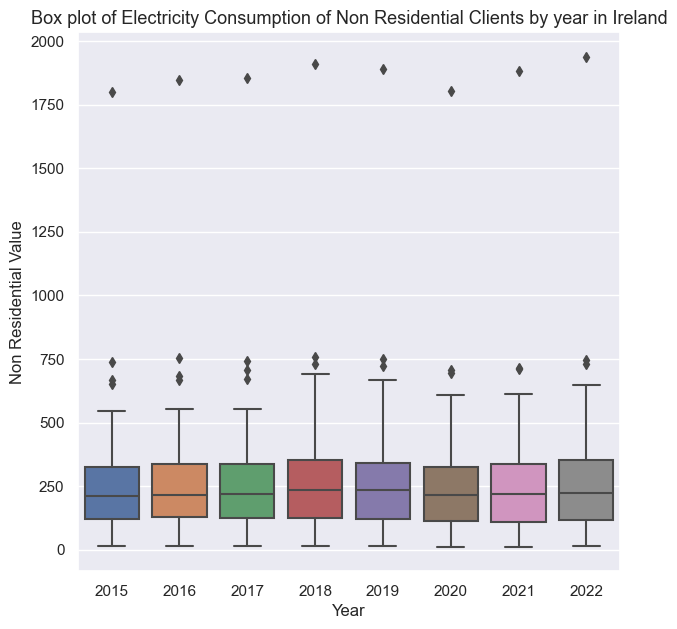

In [30]:
# Visualizing Electricity Consumption of Residential clients through a Boxplot:
sns.set(rc={"figure.figsize":(7, 7)})
sns.boxplot(data=Meters_new, x="Year", y="Non Residential Value")
plt.title('Box plot of Electricity Consumption of Non Residential Clients by year in Ireland',
          fontsize=13);

-There was a reduction in 2020 due to the lockdown restrictions since the commercial sector was force to reduce activities, but data centres still in operation. 

-It is noticed a slightly increase on 2021 after restrictions were lifted and 2022 was increasing again. 

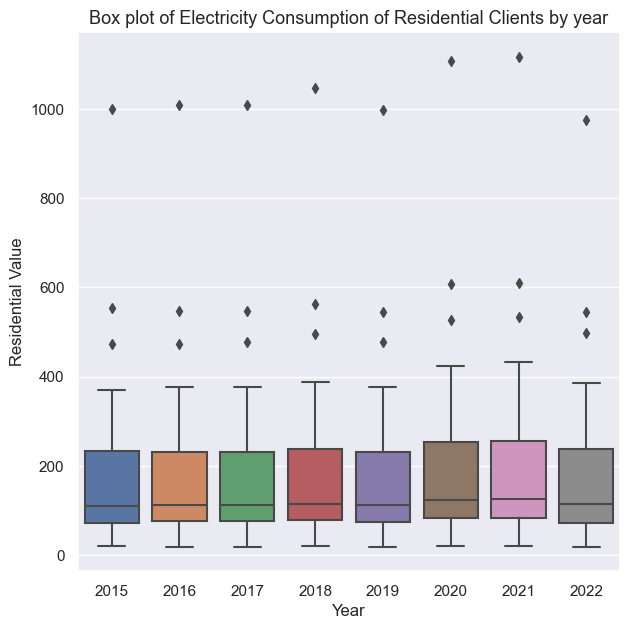

In [31]:
# Visualizing Electricity Consumption of Residential clients through a Boxplot:
sns.set(rc={"figure.figsize":(7, 7)})
sns.boxplot(data=Meters_new, x="Year", y="Residential Value")
plt.title('Box plot of Electricity Consumption of Residential Clients by year',
          fontsize=13);

**Discussion** The residential electricity consumption, which is not the variable for this research, but used just to compare it with Non Residential electricity consumption, it is noticed the increased during 2020 - 2021 due to the lockdown as many people needed to stay / work from home. In contrast, the is a reduction on 2022 as activities in the commercial sector (Non residential clients) resume to normal.

In [32]:
# Calulate the average Non Residential value per county & Dublin Postal District, using Group by to calculate mean 
data_avr = Meters_new.groupby(['Counties & Dublin Postal Districts'])['Non Residential Value'].mean()
data_avr.head(15)

Counties & Dublin Postal Districts
Co. Carlow       151.000
Co. Cavan        334.625
Co. Clare        313.625
Co. Cork        1865.875
Co. Donegal      344.250
Co. Dublin       736.125
Co. Galway       652.250
Co. Kerry        361.500
Co. Kildare      552.625
Co. Kilkenny     218.500
Co. Laois        159.500
Co. Leitrim       59.250
Co. Limerick     708.125
Co. Longford     148.125
Co. Louth        320.000
Name: Non Residential Value, dtype: float64

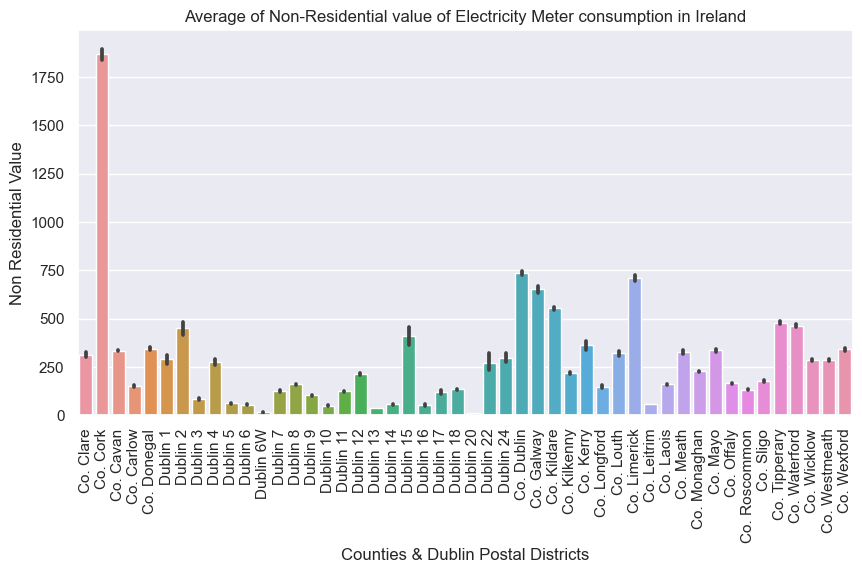

In [33]:
#Checking the distribution of metered readings by County and Dublin District - Ireland
plt.figure(figsize=(10,5)) 
plt.title("Average of Non-Residential value of Electricity Meter consumption in Ireland");
ax = sns.barplot(x="Counties & Dublin Postal Districts",y="Non Residential Value",data=Meters_new,estimator=np.mean) # confidende
#ax.set_xticklabels(rotation=90);
ax.tick_params(axis='x', labelrotation=90)

Through the bar plot below above the mean estimator is being used to calculate the average of Non-Residential value of Electricity Meter consumption by County and Co. Districts, where within the main consumers were Co. Dublin and Dublin districts, Co. Limerick, Co. Galway, and Co. Cork which host over 60 global technologies companies.


- In total, the multinational sector in Cork City and County is comprised of 194 firms employing
over 43,856 people, 7 of the top 10 global pharmaceutical companies, over 60 global
technology companies, 15 top global cyber security companies and 300 ICT related
companies. 1 DC in this area

- 1 DC in Galway.

- Co. Dublin Data Centres. 68 DC in Dublin area.

- Co. Meath - Facebook Data Centre, Amazon

- Dublin 15 Data Centres.

- Limeric ICT related companies and multinationals.

## 1.2. Correlation of the variables

In [34]:
# Checking the correlation between variables
correlation = Meters_new.corr()
print(correlation)

                                 Year  Non Residential Value  \
Year                         1.000000               0.000579   
Non Residential Value        0.000579               1.000000   
Residential Value            0.023130               0.921653   
All Metered Customers Value  0.009235               0.988834   

                             Residential Value  All Metered Customers Value  
Year                                  0.023130                     0.009235  
Non Residential Value                 0.921653                     0.988834  
Residential Value                     1.000000                     0.969183  
All Metered Customers Value           0.969183                     1.000000  


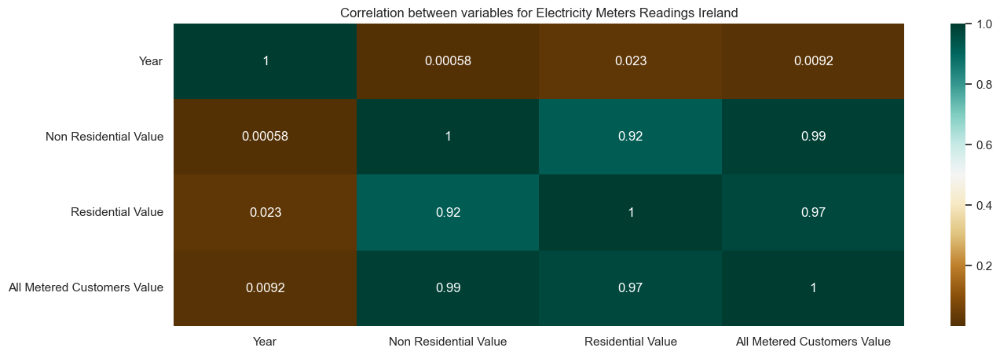

In [35]:
# Finding the relations between the variables through a heat map
plt.figure(figsize=(15,5)) 
c= Meters_new.corr() 
sns.heatmap(c,cmap="BrBG",annot=True) 
plt.title("Correlation between variables for Electricity Meters Readings Ireland");
#there is a strong correlation of 0.92 between Non Residential and Residential values. There is a week correlation 
# of 0.023 between Year and and Residential Value variable. 
#There is a weak correlation of 0.00058 between Non Residential and year features.

In [36]:
#Visualization of Pairplot of all variables
#plt.figure(figsize=(12,12))
#sns.pairplot(Meters_new)

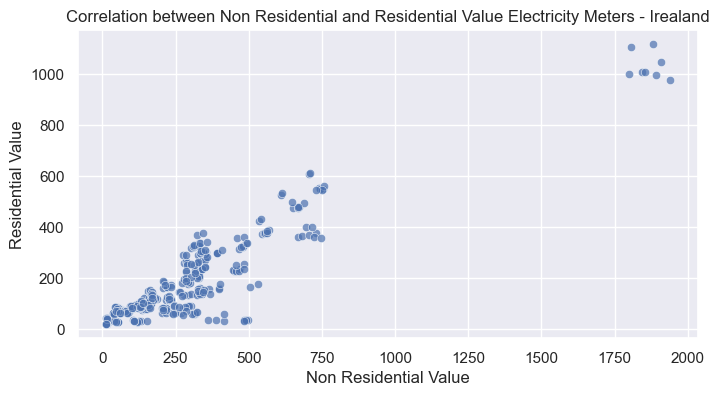

In [37]:
# Visualization strong correlation among variables
fig, ax = plt.subplots(figsize=(8,4)) 
#sns.set_style('whitegrid')
sns.set_palette('rainbow')#
sns.scatterplot(data=Meters_new, x='Non Residential Value', y='Residential Value', alpha=0.7)
plt.title("Correlation between Non Residential and Residential Value Electricity Meters - Irealand");
plt.show() 

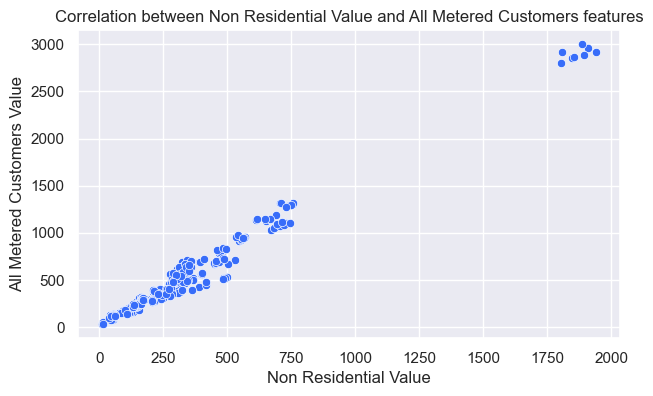

In [38]:
#Strong correlation among features
fig, ax = plt.subplots(figsize=(7,4)) 
sns.scatterplot(data = Meters_new, x = 'Non Residential Value', y = 'All Metered Customers Value')
plt.title("Correlation between Non Residential Value and All Metered Customers features");
plt.show() 

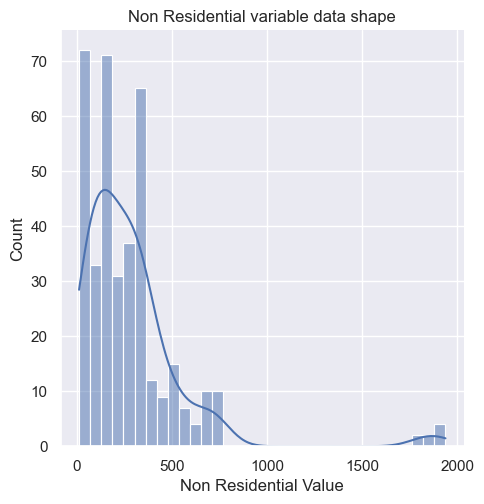

In [39]:
# Visualizing the Non Residential variable
# It can be seen that data is positive skewed in this feature.
sns.set(rc={"figure.figsize":(4, 1)})
sns.displot(data=Meters_new, x="Non Residential Value", kde=True);
plt.title("Non Residential variable data shape");

## 1.3. Outliers Detection.

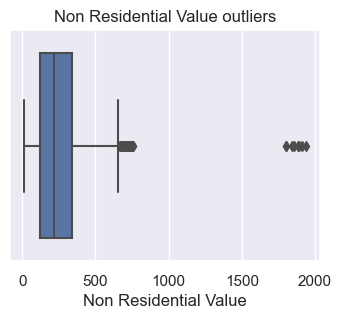

In [40]:
# Detecting Outliers
# As it can be seen below, there are ouliers in the Non Residential variable of the dataset.
sns.set(rc={"figure.figsize":(4, 3)})
sns.boxplot(x=Meters_new['Non Residential Value']); 
plt.title("Non Residential Value outliers");

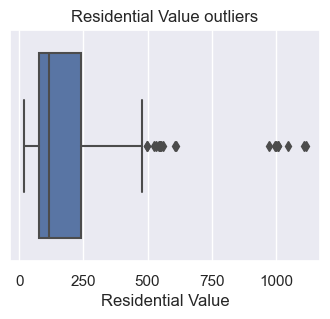

In [41]:
# Detecting Outliers on Residential variable
# As it can be seen below, there are ouliers in Residential Value feature of the dataset.
# the length of the right whisker is greater than the left whisker. It helps to conclude that data is positively skewed.
#that Q2 is present nearer to Q1
sns.set(rc={"figure.figsize":(4, 3)})
sns.boxplot(x=Meters_new['Residential Value']); 
plt.title("Residential Value outliers");

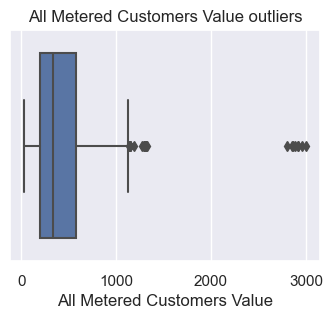

In [42]:
# Detecting Outliers on All Metered customers variable
# As it can be seen below, there are ouliers in All Metered customers Value feature of the dataset.
sns.set(rc={"figure.figsize":(4, 3)})
sns.boxplot(x=Meters_new['All Metered Customers Value']); 
plt.title("All Metered Customers Value outliers");

## 1.4. Applying Winzorization for Outliers
It has been decided not to get rid of the outliers. A winzorization for reduction of outliers has been performed instead

In [43]:
col_dict = {'Year':1 , 'Non Residential Value':2 ,
        'Residential Value':3, 'All Metered Customers Value':4}

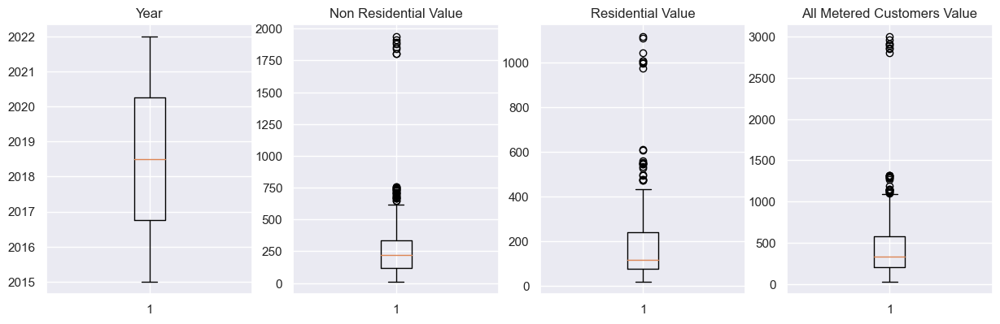

In [44]:
plt.figure(figsize=(15,25))

for variable,i in col_dict.items():
                     plt.subplot(5,4,i)
                     plt.boxplot(Meters_new[variable],whis=1.4)
                     plt.title(variable)

plt.show()

Text(0.5, 1.0, 'Winsorized_Metered Customers Value')

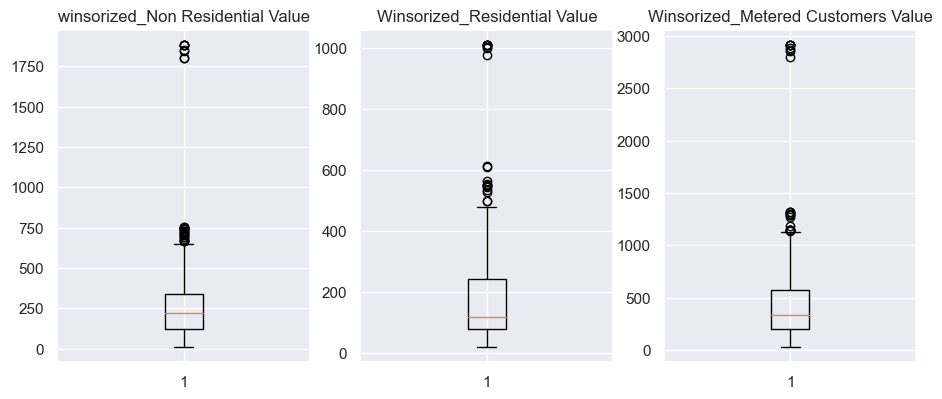

In [45]:
#Applying winsorization of outliers:
plt.figure(figsize=(15,25))

plt.subplot(5,4,1)
winsorized_Non_Residential_Value = winsorize(Meters_new['Non Residential Value'],(0,0.01)) # (0,0.01)
plt.boxplot(winsorized_Non_Residential_Value)
plt.title("winsorized_Non Residential Value")

plt.subplot(5,4,2)
winsorized_Residential_Value = winsorize(Meters_new['Residential Value'],(0,0.01)) # (0,0.01)
plt.boxplot(winsorized_Residential_Value)
plt.title("Winsorized_Residential Value")

plt.subplot(5,4,3)
winsorized_All_Metered_Customers_Value = winsorize(Meters_new['All Metered Customers Value'],(0,0.01)) # (0,0.01)
plt.boxplot(winsorized_All_Metered_Customers_Value)
plt.title("Winsorized_Metered Customers Value")

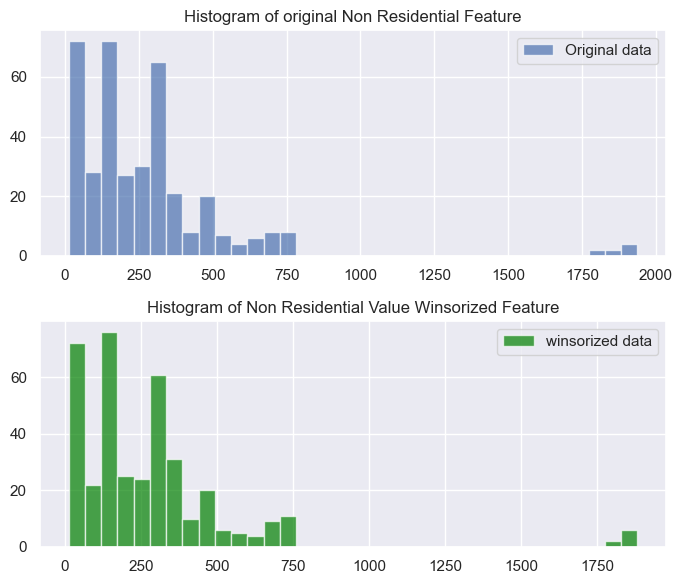

In [46]:
# Step 3: Plot the Results before and after the winsorization of outliers
plt.figure(figsize=(7, 6))
plt.subplot(2, 1, 1)
plt.hist(Meters_new['Non Residential Value'], bins=35, alpha=0.7, label='Original data')
plt.title('Histogram of original Non Residential Feature')
plt.legend()

plt.subplot(2, 1, 2)
plt.hist(winsorized_Non_Residential_Value, bins=35, alpha=0.7, color='green', label='winsorized data')
plt.title('Histogram of Non Residential Value Winsorized Feature')
plt.legend()

plt.tight_layout()
plt.show()

In [47]:
#After performing the winzorization, the shape of the data is changed. It will be better to remove the outliers

# Store the updated values of the columns into already existed dataframe
Meters_new['Non Residential Value'] = winsorized_Non_Residential_Value
Meters_new['Residential Value'] = winsorized_Residential_Value
Meters_new['All Metered Customers Value'] = winsorized_All_Metered_Customers_Value

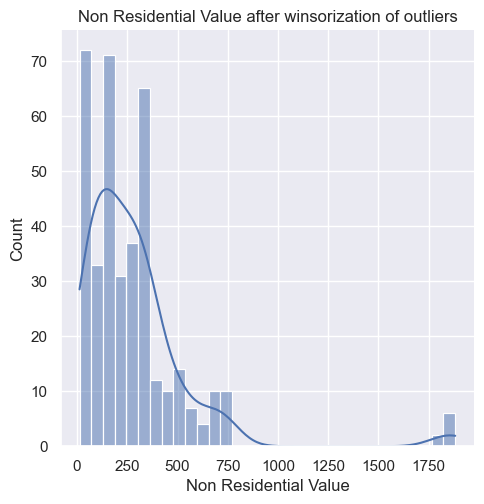

In [48]:
# Visualizing the imports variable after winsorization of outliers to check that the shape of the data is still the same as
# as before
#sns.set(rc={"figure.figsize":(3, 1)})
sns.set(rc={"figure.figsize":(4, 1)})
sns.displot(data=Meters_new, x="Non Residential Value", kde=True);
plt.title("Non Residential Value after winsorization of outliers");

#sns.set(rc={"figure.figsize":(4, 1)})
#sns.displot(data=Meters, x="Non Residential Value", kde=True);
#plt.title("Non Residential variable data shape");

## 1.5. Interactive Visualization using Plotly

In [49]:
#Interactive visualization
import plotly.express as plt
import plotly.express as px
import plotly.express as ex
import plotly.graph_objects as go

In [50]:
#Determining a mix
xmin, xmax = min('Meters.Non Residential Value'), max('Meters.Non Residential Value')
ymin, ymax = min('Meters.Residential Value'), max('Meters.Residential Value')

In [51]:
#Visualizing the interactive dashboard
#fig, ax = plt.subplots(figsize=(20,10)) 
fig = px.scatter(Meters, x="Non Residential Value", y="Residential Value", animation_frame="Year", width=800, height=600,
animation_group="Counties & Dublin Postal Districts", color="Non Residential Value", hover_name="Counties & Dublin Postal Districts", #width=800, height=600,
#facet_col="Counties & Dublin Postal Districts", width=1400, height=400, log_x=True, size_max=30,
range_x=[xmin,xmax], range_y=[ymin,ymax]) 
fig.show()

**Discussion**  A Geo space visualization was produced where it can be located the cluster between Non Residential Value, which is the target feature and Residential Value. However, since the data insight that was required for clustering is the commercial sector in Leinster Area, a Geo space visualization was done in Tableu to be able to see just the Non Residential value in terms of electricity consumption and establish which counties or Dublin city districs is Leinster area where among the main consumers of electricity.

## 1.6. Checking scaling feature engineer before Expermentation and Final ML Models

To verify that scaling process has not changed the shape of the data

In [52]:
#checking the efect of scale in the data
from sklearn.preprocessing import scale
Meters_new['scale_Non Residential Value'] = scale(Meters_new['Non Residential Value'])

In [53]:
#Feature scaling to check if data shape has not been changed
from sklearn.preprocessing import StandardScaler
Meters_new["standardized"]=StandardScaler().fit_transform(Meters_new[["Non Residential Value"]])

In [54]:
#Checking same variable Non Residential Value with Mix Max scaler
import sklearn.preprocessing as preproc
Meters_new["minmax_Non Residential Value"]=preproc.minmax_scale(Meters_new["Non Residential Value"])

In [55]:
#checking Non Residential value variable when log transformation is being applied
from sklearn.preprocessing import FunctionTransformer
import numpy as np
Meters_new['log_Non Residential Value'] = np.log10(Meters_new['Non Residential Value'] + 1)

Text(60.0, 0.5, 'Residential Value')

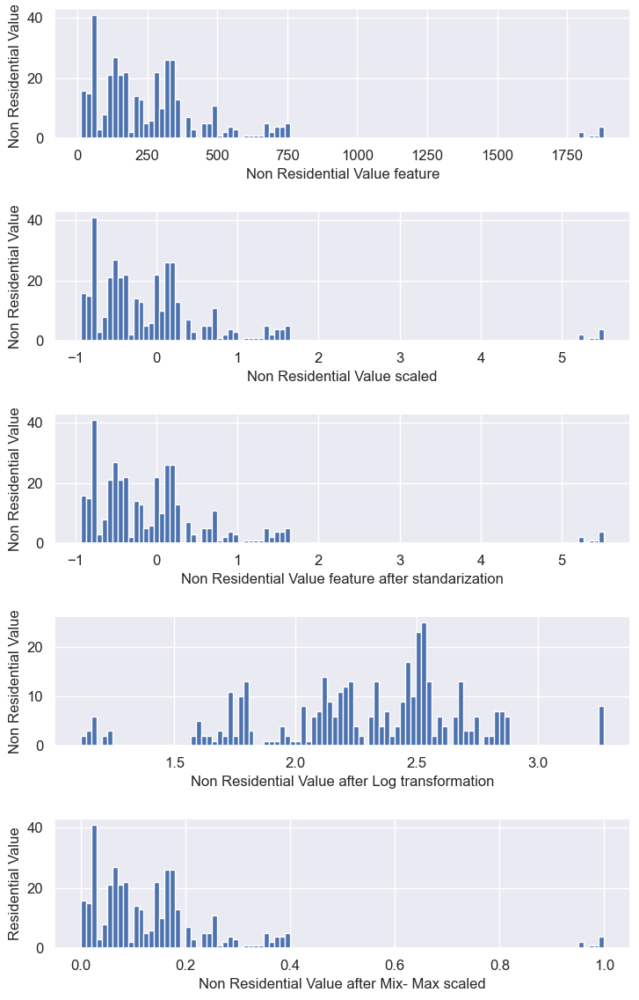

In [56]:
# Verifying Non Residential Value variable before and after the three feaure scaling techniques. 
# to check whether the shape of the data has changed or not 

from matplotlib import pyplot as plt
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5,1,figsize=(8, 12))# 8, 12
fig.tight_layout(pad=3.0)

Meters_new['Non Residential Value'].hist(ax=ax1, bins=100)
ax1.tick_params(labelsize=12)
ax1.set_xlabel('Non Residential Value feature', fontsize=12)
ax1.set_ylabel('Non Residential Value ', fontsize=12)

Meters_new['scale_Non Residential Value'].hist(ax=ax2, bins=100)
ax2.tick_params(labelsize=12)
ax2.set_xlabel('Non Residential Value scaled', fontsize=12)
ax2.set_ylabel('Non Residential Value', fontsize=12) 

Meters_new['standardized'].hist(ax=ax3, bins=100)
ax3.tick_params(labelsize=12)
ax3.set_xlabel('Non Residential Value feature after standarization', fontsize=12)
ax3.set_ylabel('Non Residential Value', fontsize=12) 

Meters_new['log_Non Residential Value'].hist(ax=ax4, bins=100)
ax4.tick_params(labelsize=12)
ax4.set_xlabel('Non Residential Value after Log transformation', fontsize=12)
ax4.set_ylabel('Non Residential Value', fontsize=12) 

Meters_new['minmax_Non Residential Value'].hist(ax=ax5, bins=100)
ax5.tick_params(labelsize=12)
ax5.set_xlabel('Non Residential Value after Mix- Max scaled', fontsize=12)
ax5.set_ylabel('Residential Value', fontsize=12) 

**Discussion:** After visualizing the different feature engineering techniques above, scale and mix max tecniques do not change the shape of the data. In contrast Log transformation method changed the shape of the data, which is not longer a true information.

# 2. Experimentation Section

###  2.1. Experiment - Model Linear Regression with no cross validation.

Trying first time with all the features, including the ones that are highly correlated and feature scaling Mix Max

In [57]:
# Select X and y
X = Meters_new.loc[:, ['Year', 'Counties & Dublin Postal Districts', 'Residential Value', 'All Metered Customers Value']] # independent variables

y = Meters_new['Non Residential Value']# dependent variables

In [58]:
# creating dummy variables for categorical variables

# subset all categorical variables
Meters_new_categorical = X.select_dtypes(include=['object'])
#Meters_new_categorical.head()

# convert into dummies
Meters_new_dummies = pd.get_dummies(Meters_new_categorical, drop_first=True)
#Meters_new_dummies.head()

# drop categorical variables 
X = X.drop(list(Meters_new_categorical.columns), axis=1)

# concat dummy variables with X
# concat the dummy variable with the main wiht Meters dataframe
X = pd.concat([X, Meters_new_dummies], axis=1)


In [59]:
X.shape

(384, 50)

In [60]:
# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 48) 

In [61]:
#normalized scaler - fit&transform on train, fit only on test
#This method scales the range of the feature between 0 and 1. Keep in mind this method is sensetive to outliers and there were 
#completely removed from the dataset.

from sklearn.preprocessing import MinMaxScaler

# fit scaler on training data
norm = MinMaxScaler().fit(X_train)

# transform training data
X_train_norm = norm.transform(X_train)

# transform testing dataabs
X_test_norm = norm.transform(X_test)


### 2.1.2. Using Recursive Feature Elimination (RFE)

There are 50 predictor features. To build the model using RFE, we need to tell RFE how many features we want in the final model. It then runs a feature elimination algorithm.

Note that the number of features to be used in the model is a hyperparameter.

In [62]:
# num of max features
len(X_train.columns)

50

In [63]:
# first model with an arbitrary choice of n_features
# running RFE with number of features=40

lm = LinearRegression()
lm.fit(X_train_norm, y_train)

rfe = RFE(lm, n_features_to_select=40)             
rfe = rfe.fit(X_train_norm, y_train)

In [64]:
# tuples of (feature name, whether selected, ranking)
# note that the 'rank' is > 1 for non-selected features
#list(zip(X_train.columns,rfe.support_,rfe.ranking_))

In [65]:
# predict prices of X_test
y_pred = rfe.predict(X_test_norm)

# evaluate the model on test set
r2 = sklearn.metrics.r2_score(y_test, y_pred)
print(r2)

0.9999351620112278


In [66]:
# try with another value of RFE
lm = LinearRegression()
lm.fit(X_train_norm, y_train)

rfe = RFE(lm, n_features_to_select=20)             
rfe = rfe.fit(X_train_norm, y_train)

# predict prices of X_test
y_pred = rfe.predict(X_test_norm)
r2 = sklearn.metrics.r2_score(y_test, y_pred)
print(r2)

0.9999375466490206


### 2.1.3. Cross-Validation in sklearn

In [67]:
# k-fold CV (using all the 50 variables)
lm = LinearRegression()
scores = cross_val_score(lm, X_train, y_train, scoring='r2', cv=5)
scores 

array([0.99976692, 0.99981132, 0.99922609, 0.99986874, 0.99980751])

### 2.1.4.Hyperparameter Tuning Using Grid Search Cross-Validation

In [68]:
# number of features in X_train
len(X_train.columns)

50

In [69]:
# step-1: create a cross-validation scheme
folds = KFold(n_splits = 5, shuffle = True, random_state = 100)

# step-2: specify range of hyperparameters to tune
hyper_params = [{'n_features_to_select': list(range(1, 51))}]


# step-3: perform grid search
# 3.1 specify model
lm = LinearRegression()
lm.fit(X_train, y_train)
rfe = RFE(lm)             

# 3.2 call GridSearchCV()
model_cv = GridSearchCV(estimator = rfe, 
                        param_grid = hyper_params, 
                        scoring= 'r2', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)      

# fit the model
model_cv.fit(X_train, y_train)         


Fitting 5 folds for each of 50 candidates, totalling 250 fits


GridSearchCV(cv=KFold(n_splits=5, random_state=100, shuffle=True),
             estimator=RFE(estimator=LinearRegression()),
             param_grid=[{'n_features_to_select': [1, 2, 3, 4, 5, 6, 7, 8, 9,
                                                   10, 11, 12, 13, 14, 15, 16,
                                                   17, 18, 19, 20, 21, 22, 23,
                                                   24, 25, 26, 27, 28, 29, 30, ...]}],
             return_train_score=True, scoring='r2', verbose=1)

In [70]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_features_to_select,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.053336,0.014532,0.001783,0.001137,1,{'n_features_to_select': 1},0.902791,0.596517,-0.062449,0.590601,...,0.513772,0.315239,50,0.824968,0.697039,0.747862,0.698627,0.705255,0.734750,0.048802
1,0.044000,0.004474,0.001682,0.000857,2,{'n_features_to_select': 2},0.998976,0.660388,0.346006,0.651504,...,0.653389,0.207771,49,0.999996,0.756216,0.777617,0.758192,0.763940,0.811192,0.094698
2,0.044968,0.009035,0.001387,0.000788,3,{'n_features_to_select': 3},0.998973,0.723897,0.444993,0.758740,...,0.708700,0.181639,48,0.999996,0.784293,0.804994,0.778694,0.802193,0.834034,0.083591
3,0.043431,0.004209,0.001615,0.000808,4,{'n_features_to_select': 4},0.998975,0.724555,0.566142,0.759062,...,0.742394,0.144056,47,0.999996,0.826596,0.833757,0.821082,0.836916,0.863670,0.068387
4,0.041803,0.002486,0.002015,0.000290,5,{'n_features_to_select': 5},0.998977,0.752175,0.555459,0.787189,...,0.757705,0.144209,46,0.999997,0.854574,0.864883,0.848944,0.849154,0.883510,0.058530


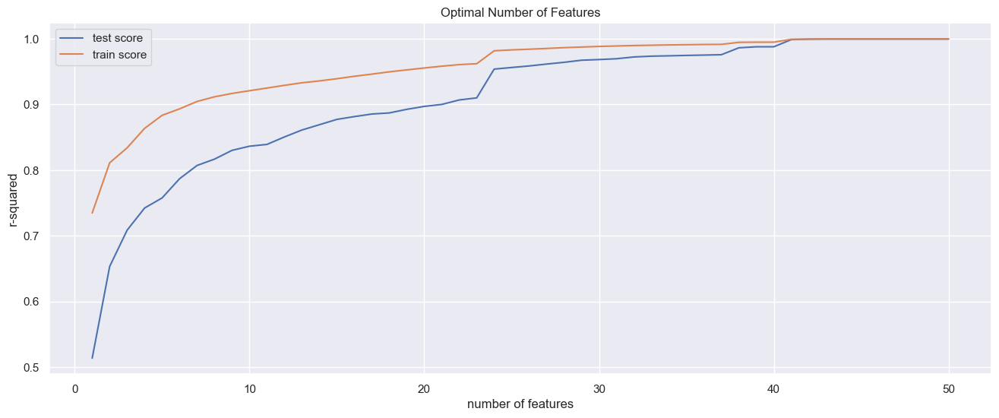

In [71]:
# plotting cv results
plt.figure(figsize=(16,6))

plt.plot(cv_results["param_n_features_to_select"], cv_results["mean_test_score"])
plt.plot(cv_results["param_n_features_to_select"], cv_results["mean_train_score"])
plt.xlabel('number of features')
plt.ylabel('r-squared')
plt.title("Optimal Number of Features")
plt.legend(['test score', 'train score'], loc='upper left')

In [72]:
# final model
n_features_optimal = 48

lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(lm, n_features_to_select=n_features_optimal)             
rfe = rfe.fit(X_train, y_train)

# predict prices of X_test
y_pred = lm.predict(X_test)
r2 = sklearn.metrics.r2_score(y_test, y_pred)
print(r2)

0.9999326464053147


### Ridge Regression

In [73]:
# Using GridSearch for parameter optimization
ridgeregr = GridSearchCV(Ridge(),
                    param_grid={
                        'alpha': [10] # 0.01, 0.1, 1, 0.001, 0.01, 0.1
                    }, verbose=1)

ridgeregr.fit(X_train, y_train)

ridge = ridgeregr.best_estimator_

Fitting 5 folds for each of 1 candidates, totalling 5 fits


### Lasso Regression

In [74]:
# Making predictions here
y_preds_train = ridge.predict(X_train)
y_preds_test_ridge = ridge.predict(X_test)

print("R-squared of the model in training set is: {}".format(ridge.score(X_train, y_train)))#0.9893
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(ridge.score(X_test, y_test)))#0.9807
print("Root mean squared error of the prediction is: {}".format(mse(y_test, y_preds_test_ridge)**(1/2)))
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_preds_test_ridge) / y_test)) * 100))

R-squared of the model in training set is: 0.9996984012347745
-----Test set statistics-----
R-squared of the model in test set is: 0.9999380947302013
Root mean squared error of the prediction is: 1.4622453101776696
Mean absolute percentage error of the prediction is: 0.9968792422641293


In [75]:
# using GridSearch for parameter optimization
lassoregr = GridSearchCV(Lasso(),
                    param_grid={
                        'alpha': [10] # 0.01, 0.1, 1  
                    }, verbose=1)

lassoregr.fit(X_train, y_train)

lasso = lassoregr.best_estimator_

Fitting 5 folds for each of 1 candidates, totalling 5 fits


In [76]:
# We are making predictions here
y_preds_train = lasso.predict(X_train)
y_preds_test_lasso = lasso.predict(X_test)

print("R-squared of the model in training set is: {}".format(lasso.score(X_train, y_train)))#0.9753
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(lasso.score(X_test, y_test)))#0.9583
print("Root mean squared error of the prediction is: {}".format(rmse(y_test, y_preds_test_lasso)))
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_preds_test_lasso) / y_test)) * 100))

R-squared of the model in training set is: 0.9996609719511556
-----Test set statistics-----
R-squared of the model in test set is: 0.9998400309210437
Root mean squared error of the prediction is: 2.350576819216531
Mean absolute percentage error of the prediction is: 1.5916672048582639


### 2.2. Experiment = Linear Regression model dropping feature highly correlated.

It is going to be tested dropping the feature " All metered customers value" and using scaling.

In [77]:
# split into X and y
X = Meters_new.loc[:, ['Year', 'Counties & Dublin Postal Districts', 'Residential Value']] # independent variables

y = Meters_new['Non Residential Value']# dependent variables

In [78]:
# creating dummy variables for categorical variables

# subset all categorical variables
Meters_new_categorical = X.select_dtypes(include=['object'])
#Meters_new_categorical.head()

# convert into dummies
Meters_new_dummies = pd.get_dummies(Meters_new_categorical, drop_first=True)
#Meters_new_dummies.head()

# drop categorical variables 
X = X.drop(list(Meters_new_categorical.columns), axis=1)

# concat dummy variables with X
# concat the dummy variable with the main wiht Meters dataframe
X = pd.concat([X, Meters_new_dummies], axis=1)

In [79]:
#X

In [80]:
X.shape

(384, 49)

In [81]:
# scaling the features
from sklearn.preprocessing import scale

# storing column names in cols, since column names are lost after 
# scaling (the df is converted to a numpy array)
cols = X.columns
X = pd.DataFrame(scale(X))
X.columns = cols
#X.columns

In [82]:
# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 48) #25

In [83]:
#X_train

### 2.2.1.Using Recursive Feature Elimination (RFE)

Now, we have 49 predictor features. To build the model using RFE, we need to tell RFE how many features we want in the final model. It then runs a feature elimination algorithm.

Note that the number of features to be used in the model is a hyperparameter.

In [84]:
# num of max features
len(X_train.columns)

49

In [85]:
# first model with an arbitrary choice of n_features
# running RFE with number of features=40

lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(lm, n_features_to_select=40)             
rfe = rfe.fit(X_train, y_train)

In [86]:
# predict prices of X_test
y_pred = rfe.predict(X_test)

# evaluate the model on test set
r2 = sklearn.metrics.r2_score(y_test, y_pred)
print(r2)

0.9822028405679754


In [87]:
# try with another value of RFE
lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(lm, n_features_to_select=49)             
rfe = rfe.fit(X_train, y_train)

# predict prices of X_test
y_pred = rfe.predict(X_test)
r2 = sklearn.metrics.r2_score(y_test, y_pred)
print(r2)

0.9840217585891966


### 2.2.2 Cross-Validation in sklearn

In [88]:
# k-fold CV (using all the 50 variables)
lm = LinearRegression()
scores = cross_val_score(lm, X_train, y_train, scoring='r2', cv=5)
print(scores)
print("Avg :",np.average(scores))

[0.96272638 0.99033024 0.99169604 0.99694832 0.99438483]
Avg : 0.9872171630982474


### 2.2.3 Hyperparameter Tuning Using Grid Search Cross-Validation

In [89]:
# number of features in X_train
len(X_train.columns)

49

In [90]:
# step-1: create a cross-validation scheme
folds = KFold(n_splits = 5, shuffle = True, random_state = 100)

# step-2: specify range of hyperparameters to tune
hyper_params = [{'n_features_to_select': list(range(1, 50))}] # 49 features


# step-3: perform grid search
# 3.1 specify model
lm = LinearRegression()
lm.fit(X_train, y_train)
rfe = RFE(lm)             

# 3.2 call GridSearchCV()
model_cv = GridSearchCV(estimator = rfe, 
                        param_grid = hyper_params, 
                        scoring= 'r2', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)      

# fit the model
model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 49 candidates, totalling 245 fits


GridSearchCV(cv=KFold(n_splits=5, random_state=100, shuffle=True),
             estimator=RFE(estimator=LinearRegression()),
             param_grid=[{'n_features_to_select': [1, 2, 3, 4, 5, 6, 7, 8, 9,
                                                   10, 11, 12, 13, 14, 15, 16,
                                                   17, 18, 19, 20, 21, 22, 23,
                                                   24, 25, 26, 27, 28, 29, 30, ...]}],
             return_train_score=True, scoring='r2', verbose=1)

In [91]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_features_to_select,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.052769,0.004157,0.002484,0.000580,1,{'n_features_to_select': 1},0.895920,0.596517,0.684463,0.590601,...,0.661780,0.125820,49,0.484058,0.697039,0.885138,0.698627,0.705255,0.694023,0.127096
1,0.054319,0.010465,0.002717,0.000582,2,{'n_features_to_select': 2},0.895546,0.660388,0.825267,0.651504,...,0.728555,0.111231,48,0.598762,0.756216,0.920500,0.758192,0.763940,0.759522,0.101774
2,0.064085,0.017125,0.002831,0.001344,3,{'n_features_to_select': 3},0.894492,0.723897,0.822074,0.758740,...,0.763220,0.093460,47,0.663016,0.784293,0.947228,0.778694,0.802193,0.795085,0.090582
3,0.043959,0.005177,0.002039,0.000068,4,{'n_features_to_select': 4},0.937349,0.724555,0.846059,0.759062,...,0.786053,0.096006,46,0.694871,0.826596,0.952243,0.821082,0.836916,0.826342,0.081578
4,0.053311,0.015540,0.002070,0.000637,5,{'n_features_to_select': 5},0.946351,0.752175,0.842273,0.787189,...,0.818697,0.070851,45,0.740400,0.854574,0.960091,0.848944,0.851260,0.851054,0.069499


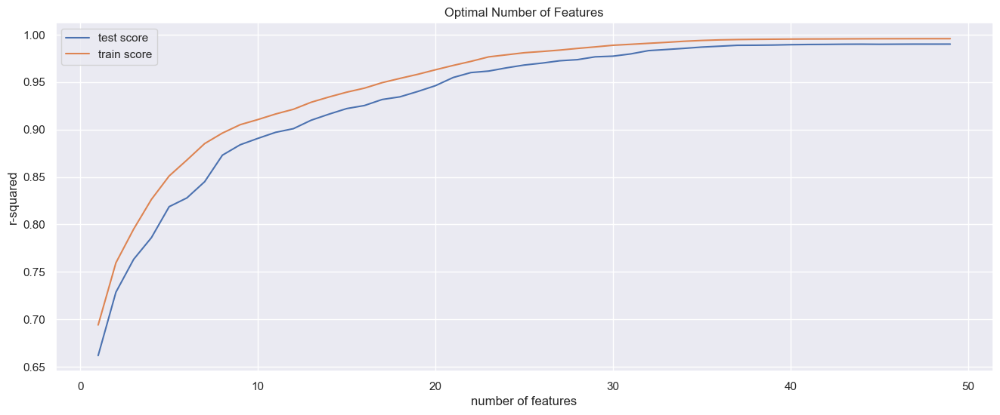

In [92]:
# plotting cv results
plt.figure(figsize=(16,6))

plt.plot(cv_results["param_n_features_to_select"], cv_results["mean_test_score"])
plt.plot(cv_results["param_n_features_to_select"], cv_results["mean_train_score"])
plt.xlabel('number of features')
plt.ylabel('r-squared')
plt.title("Optimal Number of Features")
plt.legend(['test score', 'train score'], loc='upper left')

In [93]:
# final model
n_features_optimal = 48

lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(lm, n_features_to_select=n_features_optimal)             
rfe = rfe.fit(X_train, y_train)

# predict prices of X_test
y_pred = lm.predict(X_test)
r2 = sklearn.metrics.r2_score(y_test, y_pred)
print(r2)

0.9840217585891966


In [94]:
# Display the r2 score values
from sklearn.metrics import r2_score
print("Training set score: {:.2f}".format(lm.score(X_train, y_train)))
print("Test set score: {:.2f}".format(lm.score(X_test, y_test)))  #0.90, 089

Training set score: 1.00
Test set score: 0.98


In [95]:
# K-fold CV 
lm = LinearRegression()
scores = cross_val_score(lm, X_train, y_train, scoring='r2', cv=5)
print(scores)
print("Avg :",np.average(scores))

[0.96272638 0.99033024 0.99169604 0.99694832 0.99438483]
Avg : 0.9872171630982474


### 2.3. Applying regularization to improve Linear Regression Results

### 2.3.1. Ridge Regression

In [96]:
# Using GridSearch for parameter optimization
ridgeregr = GridSearchCV(Ridge(),
                    param_grid={
                        'alpha': [10] # 0.01, 0.1, 1, 0.001, 0.01, 0.1
                    }, verbose=1)

ridgeregr.fit(X_train, y_train)

ridge = ridgeregr.best_estimator_

Fitting 5 folds for each of 1 candidates, totalling 5 fits


In [97]:
# Making predictions here
y_preds_train = ridge.predict(X_train)
y_preds_test_ridge = ridge.predict(X_test)

print("R-squared of the model in training set is: {}".format(ridge.score(X_train, y_train)))#0.9893
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(ridge.score(X_test, y_test)))#0.9807
print("Root mean squared error of the prediction is: {}".format(mse(y_test, y_preds_test_ridge)**(1/2)))
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_preds_test_ridge) / y_test)) * 100))

R-squared of the model in training set is: 0.9938932670635598
-----Test set statistics-----
R-squared of the model in test set is: 0.9809595696947212
Root mean squared error of the prediction is: 25.644533681788698
Mean absolute percentage error of the prediction is: 6.317965707759941


In [98]:
# Display the r2 score values
from sklearn.metrics import r2_score
print("Training set score: {:.2f}".format(ridge.score(X_train, y_train)))#0.99
print("Test set score: {:.2f}".format(ridge.score(X_test, y_test)))#0.98

Training set score: 0.99
Test set score: 0.98


### 2.3.2. Lasso Regression

In [99]:
# using GridSearch for parameter optimization
lassoregr = GridSearchCV(Lasso(),
                    param_grid={
                        'alpha': [10] # 0.01, 0.1, 1  
                    }, verbose=1)

lassoregr.fit(X_train, y_train)

lasso = lassoregr.best_estimator_

Fitting 5 folds for each of 1 candidates, totalling 5 fits


In [100]:
# We are making predictions here
y_preds_train = lasso.predict(X_train)
y_preds_test_lasso = lasso.predict(X_test)

print("R-squared of the model in training set is: {}".format(lasso.score(X_train, y_train)))#0.9753
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(lasso.score(X_test, y_test)))#0.9583
print("Root mean squared error of the prediction is: {}".format(rmse(y_test, y_preds_test_lasso)))
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_preds_test_lasso) / y_test)) * 100))

R-squared of the model in training set is: 0.9666893641632988
-----Test set statistics-----
R-squared of the model in test set is: 0.8890451797216516
Root mean squared error of the prediction is: 61.90553966488257
Mean absolute percentage error of the prediction is: 44.28529139963941


In [101]:
# Display the r2 score values
from sklearn.metrics import r2_score
print("Training set score: {:.2f}".format(lasso.score(X_train, y_train)))#0.98
print("Test set score: {:.2f}".format(lasso.score(X_test, y_test)))#0.96

Training set score: 0.97
Test set score: 0.89


**Discussion**: After removing the feature which is highly correlated with the target value, the regularization performed well. Training in the set score for Ridge and Lasso Regression were 0.98 and 0.89 respectively.

## 2.4. Emsembling learning with Random Forest Regressor and Gradient Boosting Regressor

In [102]:
# split into X and y
X = Meters_new.loc[:, ['Year', 'Counties & Dublin Postal Districts', 'Residential Value', 'All Metered Customers Value']] # independent variables

y = Meters_new['Non Residential Value']# dependent variables

In [103]:
# creating dummy variables for categorical variables
# subset all categorical variables
Meters_new_categorical = X.select_dtypes(include=['object'])
#Meters_new_categorical.head()

# convert into dummies
Meters_new_dummies = pd.get_dummies(Meters_new_categorical, drop_first=True)
#Meters_new_dummies.head()

# drop categorical variables 
X = X.drop(list(Meters_new_categorical.columns), axis=1)

# concat dummy variables with X
# concat the dummy variable with the main wiht Meters dataframe
X = pd.concat([X, Meters_new_dummies], axis=1)

# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 48)

### 2.4.1. Decision Tree Regressor

In [104]:
from sklearn.tree import DecisionTreeRegressor
DTregressor = DecisionTreeRegressor(max_depth = 5)
DTregressor.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=5)

In [105]:
y_pred_DT = DTregressor.predict(X_test)

In [106]:
#Accuracy of the model for DTR
from sklearn.metrics import r2_score
r2_score(y_test, y_pred_DT) # 

0.9584654168552862

In [107]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error,explained_variance_score
from statsmodels.tools.eval_measures import mse, rmse
print("R-squared of the model in training set is: {}".format(DTregressor.score(X_train, y_train)))#0.9986
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(DTregressor.score(X_test, y_test)))#0.8659
print("Root mean squared error of the prediction is: {}".format(mse(y_test, y_pred_DT)**(1/2)))#43.53
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_pred_DT) / y_test)) * 100))#18.17

R-squared of the model in training set is: 0.9926455889274394
-----Test set statistics-----
R-squared of the model in test set is: 0.9584654168552862
Root mean squared error of the prediction is: 37.8757599000628
Mean absolute percentage error of the prediction is: 11.546762665433862


### 2.4.2 Gradient Boosting Regressor

In [108]:
from sklearn.ensemble import GradientBoostingRegressor
model= GradientBoostingRegressor(n_estimators=100, 
    learning_rate=0.2, 
    max_depth=3
)
model.fit(X_train, y_train)
#model.score(X_test,y_test)

GradientBoostingRegressor(learning_rate=0.2)

In [109]:
y_gradient_pred = model.predict(X_test)

#Accuracy of Random Regression model
from sklearn.metrics import r2_score
r2_score(y_test, y_gradient_pred) ## 0.9841

0.9918904987084175

### 2.4.3. Random Forest Regressor

In [110]:
from sklearn.ensemble import RandomForestRegressor
regressor = RandomForestRegressor(n_estimators = 100, random_state = 3)
regressor.fit(X_train, y_train)

RandomForestRegressor(random_state=3)

In [111]:
y_pred_random = regressor.predict(X_test)

In [112]:
#Accuracy of Random Regression model

from sklearn.metrics import r2_score
r2_score(y_test, y_pred_random) ## 0.9841

0.9909890119096201

In [113]:
#from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error,explained_variance_score
print("R-squared of the model in training set is: {}".format(regressor.score(X_train, y_train)))#0.9981
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(regressor.score(X_test, y_test)))#0.9841
print("Root mean squared error of the prediction is: {}".format(mse(y_test, y_pred_random)**(1/2)))#38.97
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_pred_random) / y_test)) * 100))

R-squared of the model in training set is: 0.9995816455664116
-----Test set statistics-----
R-squared of the model in test set is: 0.9909890119096201
Root mean squared error of the prediction is: 17.64178945189334
Mean absolute percentage error of the prediction is: 3.1739378169535732


**Discussion** After the experimentation with ensemble learning regressors, both scored well on the test set. Gradient Boosting Regressor yield an accurary of **0.9783** and Random Forest Regressor with **0.9841**

### 2.4.4. Finding Important Features in Scikit-learn

In [114]:
# Import train_test_split function
from sklearn.model_selection import train_test_split

# Splitting the dataset into the Training set and Test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 48) 

# Create a Random Forest Regressor
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(n_estimators=100, random_state=3)#= 48

# Train the model using the training sets y_pred_random=regressor.predict(X_test)
rf.fit(X_train, y_train)

y_pred_random = rf.predict(X_test)

In [115]:
#Use the feature importance variable to see feature importance scores.
import pandas as pd
feature_imp = pd.Series(rf.feature_importances_, index=X_train.columns).sort_values(ascending=False)
feature_imp.head(15)

All Metered Customers Value                         0.545609
Residential Value                                   0.250794
Counties & Dublin Postal Districts_Co. Cork         0.196049
Counties & Dublin Postal Districts_Co. Kildare      0.001370
Counties & Dublin Postal Districts_Co. Galway       0.001089
Counties & Dublin Postal Districts_Dublin 2         0.001021
Counties & Dublin Postal Districts_Co. Kilkenny     0.000914
Year                                                0.000713
Counties & Dublin Postal Districts_Co. Meath        0.000376
Counties & Dublin Postal Districts_Co. Wicklow      0.000318
Counties & Dublin Postal Districts_Co. Waterford    0.000279
Counties & Dublin Postal Districts_Dublin 15        0.000234
Counties & Dublin Postal Districts_Co. Kerry        0.000227
Counties & Dublin Postal Districts_Co. Westmeath    0.000130
Counties & Dublin Postal Districts_Dublin 17        0.000101
dtype: float64

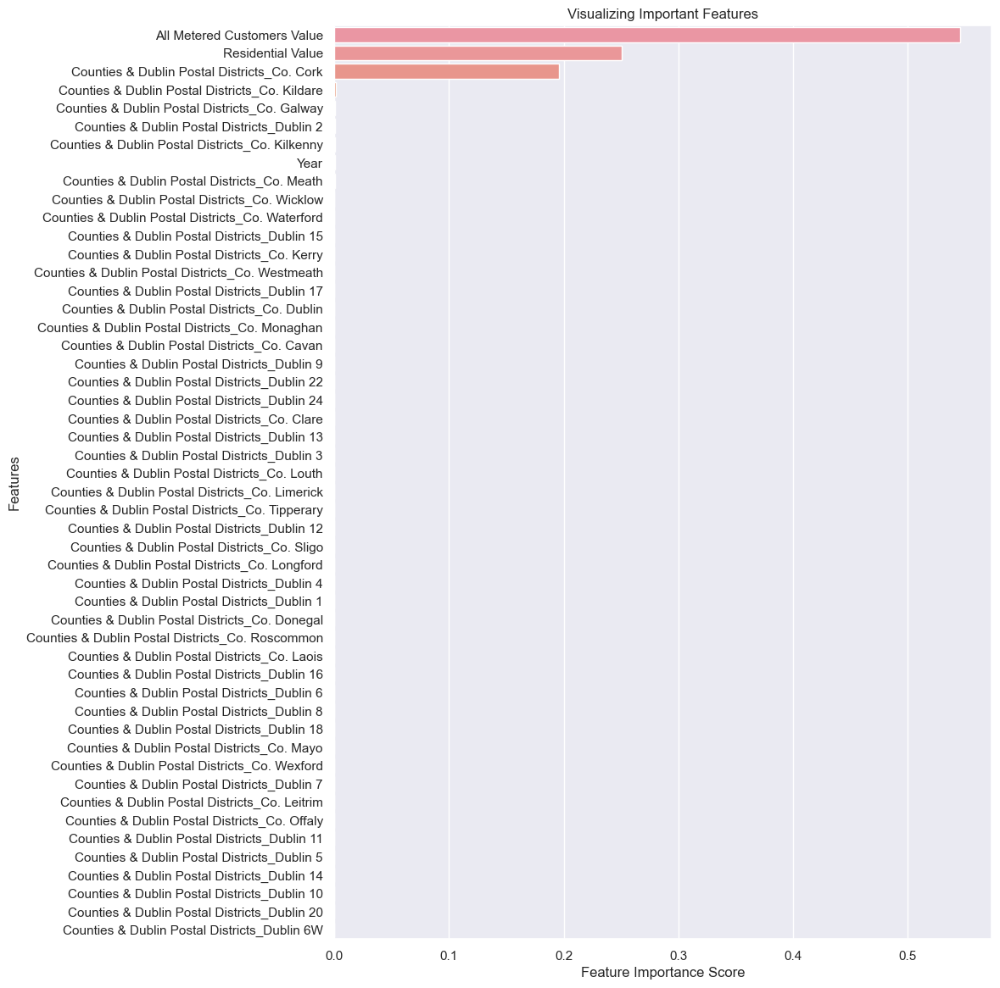

In [116]:
#Visualize the feature importance. 
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
plt.figure(figsize=(10,14)) 
# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
#plt.legend()
plt.show()

## 2.5. Generating the Model on Selected Features

We can remove the "All Metered Customers" feature because it has very low importance, and select the 2 remaining features.

### 2.5.1 RFR Removing "year" feature

In [117]:
# Import train_test_split function
X=Meters_new[['Counties & Dublin Postal Districts', 'Residential Value', 'All Metered Customers Value']]  # Removing "Year" feature"
y=Meters_new['Non Residential Value']  # Labels

# creating dummy variables for categorical variables
# subset all categorical variables
Meters_new_categorical = X.select_dtypes(include=['object'])
#Meters_new_categorical.head()

# convert into dummies
Meters_new_dummies = pd.get_dummies(Meters_new_categorical, drop_first=True)
#Meters_new_dummies.head()

# drop categorical variables 
X = X.drop(list(Meters_new_categorical.columns), axis=1)

# concat dummy variables with X
# concat the dummy variable with the main wiht Meters dataframe
X = pd.concat([X, Meters_new_dummies], axis=1)

# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 48) 


# Create a Random Forest Regressor
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(n_estimators=100, random_state=3)

# Train the model using the training sets y_pred_random=regressor.predict(X_test)
rf.fit(X_train, y_train)

y_pred_r = rf.predict(X_test)

In [118]:
#Accuracy of Random Regression model

from sklearn.metrics import r2_score
r2_score(y_test, y_pred_r) ## 

0.9914432726857789

In [119]:
# Display the r2 score values
from sklearn.metrics import r2_score
print("Training set score: {:.2f}".format(rf.score(X_train, y_train)))
print("Test set score: {:.2f}".format(rf.score(X_test, y_test)))  #1.00 # 0.99

Training set score: 1.00
Test set score: 0.99


### 2.5.2. Decision Tree Regressor 

In [120]:
from sklearn.tree import DecisionTreeRegressor
DTregressor = DecisionTreeRegressor(max_depth = 5)
DTregressor.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=5)

In [121]:
y_pred_DT = DTregressor.predict(X_test)

In [122]:
#Accuracy of the model for DTR
from sklearn.metrics import r2_score
r2_score(y_test, y_pred_DT) # 

0.9584654168552862

In [123]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error,explained_variance_score
from statsmodels.tools.eval_measures import mse, rmse
print("R-squared of the model in training set is: {}".format(DTregressor.score(X_train, y_train)))#0.9986
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(DTregressor.score(X_test, y_test)))#0.8659
print("Root mean squared error of the prediction is: {}".format(mse(y_test, y_pred_DT)**(1/2)))#43.53
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_pred_DT) / y_test)) * 100))#18.17

R-squared of the model in training set is: 0.9925099337440891
-----Test set statistics-----
R-squared of the model in test set is: 0.9584654168552862
Root mean squared error of the prediction is: 37.8757599000628
Mean absolute percentage error of the prediction is: 11.546762665433862


### 2.5.3 Gradient Boosting Regressor 

In [124]:
from sklearn.ensemble import GradientBoostingRegressor
model= GradientBoostingRegressor(n_estimators=100, 
    learning_rate=0.2, 
    max_depth=3
)
model.fit(X_train, y_train)
#model.score(X_test,y_test)

GradientBoostingRegressor(learning_rate=0.2)

In [125]:
y_gradient_pred = model.predict(X_test)

#Accuracy of Random Regression model
from sklearn.metrics import r2_score
r2_score(y_test, y_gradient_pred) ## 

0.9902187290830575

## 2.6. Removing Highly the feature that is highly correlated

### 2.6.1 Random Forest Regressor

In [126]:
# Import train_test_split function
X=Meters_new[['Year', 'Counties & Dublin Postal Districts', 'Residential Value']]  # Adding back "Year", but removing 'All Metered Customers Value' Feature
y=Meters_new['Non Residential Value']  # Labels

# creating dummy variables for categorical variables
# subset all categorical variables
Meters_new_categorical = X.select_dtypes(include=['object'])
#Meters_new_categorical.head()

# convert into dummies
Meters_new_dummies = pd.get_dummies(Meters_new_categorical, drop_first=True)
#Meters_new_dummies.head()

# drop categorical variables 
X = X.drop(list(Meters_new_categorical.columns), axis=1)

# concat dummy variables with X
# concat the dummy variable with the main wiht Meters dataframe
X = pd.concat([X, Meters_new_dummies], axis=1)

# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 48) 

#Create a Random Forest Regressor
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(n_estimators=100, random_state=3)

# Train the model using the training sets y_pred_random=regressor.predict(X_test)
rf.fit(X_train, y_train)

y_pred_r = rf.predict(X_test)

In [127]:
#Accuracy of Random Regression model

from sklearn.metrics import r2_score
r2_score(y_test, y_pred_r) ## 0.8637

0.9725198177990098

In [128]:
# Display the r2 score values
from sklearn.metrics import r2_score
print("Training set score: {:.2f}".format(rf.score(X_train, y_train)))
print("Test set score: {:.2f}".format(rf.score(X_test, y_test)))  #1.00 # 0.97

Training set score: 1.00
Test set score: 0.97


In [129]:
#from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error,explained_variance_score
print("R-squared of the model in training set is: {}".format(rf.score(X_train, y_train)))#0.9981
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(rf.score(X_test, y_test)))#0.9841
print("Root mean squared error of the prediction is: {}".format(mse(y_test, y_pred_r)**(1/2)))#38.97
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_pred_r) / y_test)) * 100))

R-squared of the model in training set is: 0.9980444497267186
-----Test set statistics-----
R-squared of the model in test set is: 0.9725198177990098
Root mean squared error of the prediction is: 30.808193314842008
Mean absolute percentage error of the prediction is: 8.29851990065132


In [130]:
# K-fold CV 
rf = RandomForestRegressor(n_estimators=100, random_state=3)
scores = cross_val_score(rf, X_train, y_train, scoring='r2', cv=5)
print(scores)
print("Avg :",np.average(scores))

[0.91854103 0.98751707 0.99261409 0.97753676 0.99309472]
Avg : 0.9738607352057688


### 2.6.2  Gradient Boosting Regressor

In [131]:
from sklearn.ensemble import GradientBoostingRegressor
model= GradientBoostingRegressor(n_estimators=100, 
    learning_rate=0.2, 
    max_depth=3
)
model.fit(X_train, y_train)
#model.score(X_test,y_test)

GradientBoostingRegressor(learning_rate=0.2)

In [132]:
y_gradient_pred = model.predict(X_test)

#Accuracy of Random Regression model
from sklearn.metrics import r2_score
r2_score(y_test, y_gradient_pred) ## 0.9841

0.9869219486339859

In [133]:
#from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error,explained_variance_score
print("R-squared of the model in training set is: {}".format(model.score(X_train, y_train)))
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(model.score(X_test, y_test)))
print("Root mean squared error of the prediction is: {}".format(mse(y_test, y_gradient_pred)**(1/2)))
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_gradient_pred) / y_test)) * 100))

R-squared of the model in training set is: 0.9983199178570019
-----Test set statistics-----
R-squared of the model in test set is: 0.9869219486339859
Root mean squared error of the prediction is: 21.253377010708014
Mean absolute percentage error of the prediction is: 11.893181734319992


In [134]:
# K-fold CV 
model= GradientBoostingRegressor(n_estimators=100, 
    learning_rate=0.2, 
    max_depth=3
)
scores = cross_val_score(model, X_train, y_train, scoring='r2', cv=5)
print(scores)
print("Avg :",np.average(scores))

[0.93369939 0.98991627 0.99450689 0.99141859 0.9950752 ]
Avg : 0.9809232690046701


### 2.6.3 Decision Tree Regressor

In [135]:
from sklearn.tree import DecisionTreeRegressor
DTregressor = DecisionTreeRegressor(max_depth = 5)
DTregressor.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=5)

In [136]:
y_pred_DT = DTregressor.predict(X_test)

In [137]:
#Accuracy of the model for DTR
from sklearn.metrics import r2_score
r2_score(y_test, y_pred_DT) # 

0.8515889145384008

In [138]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error,explained_variance_score
from statsmodels.tools.eval_measures import mse, rmse
print("R-squared of the model in training set is: {}".format(DTregressor.score(X_train, y_train)))#0.9986
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(DTregressor.score(X_test, y_test)))#0.8659
print("Root mean squared error of the prediction is: {}".format(mse(y_test, y_pred_DT)**(1/2)))#43.53
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_pred_DT) / y_test)) * 100))#18.17

R-squared of the model in training set is: 0.9632680783660306
-----Test set statistics-----
R-squared of the model in test set is: 0.8515889145384008
Root mean squared error of the prediction is: 71.59613817483333
Mean absolute percentage error of the prediction is: 48.09134690503248


In [139]:
# K-fold CV 
DTregressor = DecisionTreeRegressor(max_depth = 5)
scores = cross_val_score(DTregressor, X_train, y_train, scoring='r2', cv=5)
print(scores)
print("Avg :",np.average(scores))

[0.67392374 0.93361494 0.9707194  0.93779209 0.96311144]
Avg : 0.8958323233505358


**Discussion:** After removing "year" feature, the overfitting of the model is not resolved. In contrast, when removing the highly correlated feature, it is possible to obtain a more generalized model with an R2 score in test set of **0.98** for GBR

## 2.7 Polynomial Features

In [140]:
# Select X and y

df=Meters_new.loc[:,['Residential Value', 'Non Residential Value']]  # Features
#df.head()

In [141]:
# recaling the variables (both)
from sklearn.preprocessing import MinMaxScaler
df_columns = df.columns
scaler = MinMaxScaler()
df = scaler.fit_transform(df)

# rename columns (since now its an np array)
df = pd.DataFrame(df)
df.columns = df_columns
#df.head()

In [142]:
# split into train and test
df_train, df_test = train_test_split(df, 
                                     train_size = 0.8, 
                                     test_size = 0.2, 
                                     random_state = 48)
print(len(df_train))
print(len(df_test))

307
77


In [143]:
# split into X and y for both train and test sets
# reshaping is required since sklearn requires the data to be in shape
# (n, 1), not as a series of shape (n, )
X_train = df_train['Residential Value']
X_train = X_train.values.reshape(-1, 1)
y_train = df_train['Non Residential Value']

X_test = df_test['Residential Value']
X_test = X_test.values.reshape(-1, 1)
y_test = df_test['Non Residential Value']

In [144]:
# fit multiple polynomial features
degrees = [1, 2, 3, 6]

# initialise y_train_pred and y_test_pred matrices to store the train and test predictions
# each row is a data point, each column a prediction using a polynomial of some degree
y_train_pred = np.zeros((len(X_train), len(degrees)))
y_test_pred = np.zeros((len(X_test), len(degrees)))

for i, degree in enumerate(degrees):
    
    # make pipeline: create features, then feed them to linear_reg model
    model = make_pipeline(PolynomialFeatures(degree), LinearRegression())
    model.fit(X_train, y_train)
    
    # predict on test and train data
    # store the predictions of each degree in the corresponding column
    y_train_pred[:, i] = model.predict(X_train)
    y_test_pred[:, i] = model.predict(X_test)

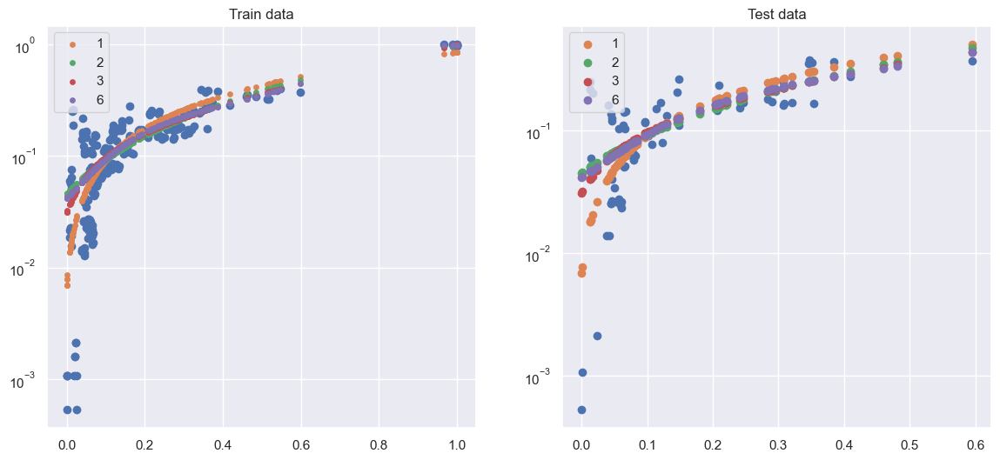

In [145]:
# visualise train and test predictions
# note that the y axis is on a log scale

plt.figure(figsize=(14, 6))

# train data
plt.subplot(121)
plt.scatter(X_train, y_train)
plt.yscale('log')
plt.title("Train data")
for i, degree in enumerate(degrees):    
    plt.scatter(X_train, y_train_pred[:, i], s=15, label=str(degree))
    plt.legend(loc='upper left')
    
# test data
plt.subplot(122)
plt.scatter(X_test, y_test)
plt.yscale('log')
plt.title("Test data")
for i, degree in enumerate(degrees):    
    plt.scatter(X_test, y_test_pred[:, i], label=str(degree))
    plt.legend(loc='upper left')

In [146]:
# compare r2 for train and test sets (for all polynomial fits)
print("R-squared values: \n")

for i, degree in enumerate(degrees):
    train_r2 = round(sklearn.metrics.r2_score(y_train, y_train_pred[:, i]), 2)
    test_r2 = round(sklearn.metrics.r2_score(y_test, y_test_pred[:, i]), 2)
    print("Polynomial degree {0}: train score={1}, test score={2}".format(degree, 
                                                                         train_r2, 
                                                                         test_r2))

R-squared values: 

Polynomial degree 1: train score=0.87, test score=0.55
Polynomial degree 2: train score=0.91, test score=0.63
Polynomial degree 3: train score=0.91, test score=0.63
Polynomial degree 6: train score=0.91, test score=0.63


**Discussion** Addding polynommial features will not produced betters scores. They tend to perform better in data with non-linear relation.

### 2.8. Support Vector Regressor.

### 2.8.1. SVR model with all features

In [147]:
# Select X and y
#X=Data_Centres_new.loc[:,['Quarter', 'Customers other than Data Centers Value', 'All Metered Customers']]  # Features
#y=Data_Centres_new['Data Centres Value']  # Labels

X = Meters_new.loc[:, ['Year', 'Counties & Dublin Postal Districts', 'Residential Value', 'All Metered Customers Value']] # independent variables
y = Meters_new['Non Residential Value']# dependent variables

# creating dummy variables for categorical variables
# subset all categorical variables
Meters_new_categorical = X.select_dtypes(include=['object'])
#Meters_new_categorical.head()

# convert into dummies
Meters_new_dummies = pd.get_dummies(Meters_new_categorical, drop_first=True)
#Meters_new_dummies.head()

# drop categorical variables 
X = X.drop(list(Meters_new_categorical.columns), axis=1)

# concat dummy variables with X
# concat the dummy variable with the main wiht Meters dataframe
X = pd.concat([X, Meters_new_dummies], axis=1)

# performing preprocessing part
from sklearn.preprocessing import StandardScaler
# Create and initialise an object (sc) by calling a method named as StandardScaler()
sc_X = StandardScaler()
sc_y = StandardScaler()

# Train the model by calling a method fit_transform()
X = sc_X.fit_transform(X)
y = sc_y.fit_transform(pd.DataFrame(y))

# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 48) 

In [148]:
# Training the SVR model on the Training set
from sklearn.svm import SVR
regressor = SVR(kernel='linear')# degree=3, gamma='scale')  #(kernel = 'rbf')  
regressor.fit(X_train, y_train)

SVR(kernel='linear')

In [149]:
#Evaluation of the model
y_pred_svr = regressor.predict(X_test)

#Accuracy of the SVR model
from sklearn.metrics import r2_score
r2_score(y_test, y_pred_svr)  

0.9897089985058644

In [150]:
#Display the r2 score values on training and test set
from sklearn.metrics import r2_score
print("Training set score: {:.2f}".format(regressor.score(X_train, y_train)))
print("Test set score: {:.2f}".format(regressor.score(X_test, y_test))) 

Training set score: 1.00
Test set score: 0.99


### 2.8.2. SVR Model removing "Year" variable

In [151]:
#Select X and Y
X=Meters_new.loc[:,['Counties & Dublin Postal Districts', 'Residential Value']]  # removing 'Year' Feature
y=Meters_new['Non Residential Value']  # Labels

# creating dummy variables for categorical variables
# subset all categorical variables
Meters_new_categorical = X.select_dtypes(include=['object'])
#Meters_new_categorical.head()

# convert into dummies
Meters_new_dummies = pd.get_dummies(Meters_new_categorical, drop_first=True)
#Meters_new_dummies.head()

# drop categorical variables 
X = X.drop(list(Meters_new_categorical.columns), axis=1)

# concat dummy variables with X
# concat the dummy variable with the main wiht Meters dataframe
X = pd.concat([X, Meters_new_dummies], axis=1)

# performing preprocessing part
from sklearn.preprocessing import StandardScaler
# Create and initialise an object (sc) by calling a method named as StandardScaler()
sc_X = StandardScaler()
sc_y = StandardScaler()

# Train the model by calling a method fit_transform()
X = sc_X.fit_transform(X)
y = sc_y.fit_transform(pd.DataFrame(y))

# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 48) 

In [152]:
# Training the SVR model on the Training set
from sklearn.svm import SVR
regressor = SVR(kernel='linear')# degree=3, gamma='scale')  #(kernel = 'rbf')  
regressor.fit(X_train, y_train)

SVR(kernel='linear')

In [153]:
#Evaluation of the model
y_pred_svr = regressor.predict(X_test)

#Accuracy of the SVR model
from sklearn.metrics import r2_score
r2_score(y_test, y_pred_svr)  

0.9762954237311876

In [154]:
#Display the r2 score values on training and test set
from sklearn.metrics import r2_score
print("Training set score: {:.2f}".format(regressor.score(X_train, y_train)))
print("Test set score: {:.2f}".format(regressor.score(X_test, y_test))) 

Training set score: 0.99
Test set score: 0.98


### 2.8.3. SVR Model removing the highly correlated feature

In [155]:
#Select X and Y
X=Meters_new.loc[:,['Year', 'Counties & Dublin Postal Districts', 'Residential Value']]  # removing 'All Metered Customers Value' Feature
y=Meters_new['Non Residential Value']  # Labels

# creating dummy variables for categorical variables
# subset all categorical variables
Meters_new_categorical = X.select_dtypes(include=['object'])
#Meters_new_categorical.head()

# convert into dummies
Meters_new_dummies = pd.get_dummies(Meters_new_categorical, drop_first=True)
#Meters_new_dummies.head()

# drop categorical variables 
X = X.drop(list(Meters_new_categorical.columns), axis=1)

# concat dummy variables with X
# concat the dummy variable with the main wiht Meters dataframe
X = pd.concat([X, Meters_new_dummies], axis=1)

# performing preprocessing part
from sklearn.preprocessing import StandardScaler
# Create and initialise an object (sc) by calling a method named as StandardScaler()
sc_X = StandardScaler()
sc_y = StandardScaler()

# Train the model by calling a method fit_transform()
X = sc_X.fit_transform(X)
y = sc_y.fit_transform(pd.DataFrame(y))

# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 48) 

In [156]:
# Training the SVR model on the Training set
from sklearn.svm import SVR
regressor = SVR(kernel='linear')# degree=3, gamma='scale')  #(kernel = 'rbf')  
regressor.fit(X_train, y_train)

SVR(kernel='linear')

In [157]:
#Evaluation of the model
y_pred_svr = regressor.predict(X_test)

#Accuracy of the SVR model
from sklearn.metrics import r2_score
r2_score(y_test, y_pred_svr)  

0.976347105955837

In [158]:
#Display the r2 score values on training and test set
from sklearn.metrics import r2_score
print("Training set score: {:.2f}".format(regressor.score(X_train, y_train)))
print("Test set score: {:.2f}".format(regressor.score(X_test, y_test))) 

Training set score: 0.99
Test set score: 0.98


In [159]:
# K-fold CV 
regressor = SVR(kernel='linear')
scores = cross_val_score(regressor, X_train, y_train, scoring='r2', cv=5)
print(scores)
print("Avg :",np.average(scores))

[0.95280383 0.98672275 0.99090601 0.9930344  0.99020133]
Avg : 0.9827336657603201


## 2.9. Artificial Neural Network for Regression

In [160]:
# Select X and y
X = Meters_new.loc[:, ['Year', 'Counties & Dublin Postal Districts', 'Residential Value', 'All Metered Customers Value']] # independent variables
y = Meters_new['Non Residential Value']# dependent variables

# creating dummy variables for categorical variables
# subset all categorical variables
Meters_new_categorical = X.select_dtypes(include=['object'])
#Meters_new_categorical.head()

# convert into dummies
Meters_new_dummies = pd.get_dummies(Meters_new_categorical, drop_first=True)
#Meters_new_dummies.head()

# drop categorical variables 
X = X.drop(list(Meters_new_categorical.columns), axis=1)

# concat dummy variables with X
# concat the dummy variable with the main wiht Meters dataframe
X = pd.concat([X, Meters_new_dummies], axis=1)

# performing preprocessing part
from sklearn.preprocessing import StandardScaler
# Create and initialise an object (sc) by calling a method named as StandardScaler()
sc_X = StandardScaler()
sc_y = StandardScaler()

# Train the model by calling a method fit_transform()
X = sc_X.fit_transform(X)
y = sc_y.fit_transform(pd.DataFrame(y))

In [161]:
# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 48) 

In [162]:
# performing preprocessing part
from sklearn.preprocessing import StandardScaler
# Create and initialise an object (sc) by calling a method named as StandardScaler()
sc_X = StandardScaler()
sc_y = StandardScaler()

# Train the model by calling a method fit_transform()
X = sc_X.fit_transform(X)
y = sc_y.fit_transform(pd.DataFrame(y))

### 2.9.1. Building an Artificial Neural Network model (ANN)

In [163]:
from keras.layers import Dense
from keras.models import Sequential

# Build neural network in Keras
model = Sequential()

# Add fully connected layer with a ReLU activation function
model.add(Dense(7, input_dim=50, activation='relu', )) # 10 # 5

# Add fully connected layer with a ReLU activation function
model.add(Dense(3, activation='relu')) #2 units

# Add fully connected layer with a sigmoid activation function - Output layer
model.add(Dense(1, activation='linear')) # output layer

In [164]:
#Compile neural network
#model.compile(loss='mean_squared_error', optimizer='rmsprop', metrics='mse')
model.compile(loss='mean_squared_error', optimizer='rmsprop', metrics='mse') # mae

In [165]:
# early stopping callback
from keras.callbacks import EarlyStopping
es = EarlyStopping(monitor='val_loss',
                   mode='min',
                   patience=50,
                   restore_best_weights = True)

In [166]:
model.fit(X_train, y_train,
                    validation_data = (X_test, y_test),
                    callbacks=[es],
                    epochs=5000,
                    batch_size=50,
                    verbose=0)

In [167]:
#Fitting the model with 25 epochs, batch size 100
#model.fit(X_train, y_train, epochs=500, batch_size=100, validation_split=0.2)

In [168]:
train_pred = model.predict(X_train)
test_pred = model.predict(X_test)

3/3 [==============================] - 0s 3ms/step


In [169]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
print("Train Accuracy: ",mean_squared_error(y_train, train_pred)) # 
print("Test Accuracy: ",mean_squared_error(y_test, test_pred)) # 

Train Accuracy:  0.8388697206981743
Test Accuracy:  0.25260687548017124


In [170]:
# History of the ANN model
history = model.fit(X_train, y_train,
                    validation_data = (X_test, y_test),
                    callbacks=[es],
                    epochs=5000,
                    batch_size=50,
                    verbose=0)

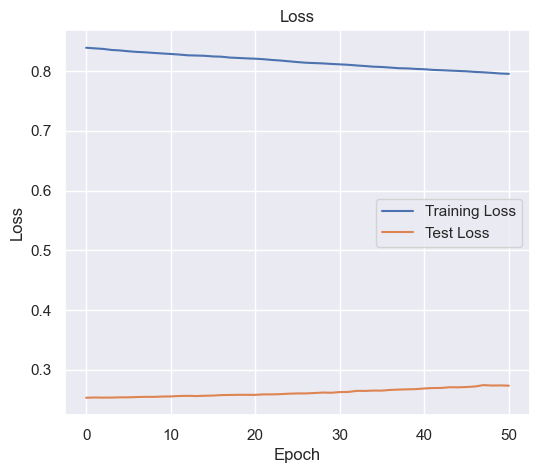

In [171]:
#Visualizing the loss in train set 
plt.figure(figsize=(6,5))
plt.title('Loss') 
plt.plot(history.history['loss'], label='train') 
plt.plot(history.history['val_loss'], label='test') 
plt.legend(["Training Loss", "Test Loss"])
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.show();

# 3. Final Model Building after Experimentation

## 3.1. Data Preparation

In [172]:
# split into X and y
X = Meters_new.loc[:, ['Counties & Dublin Postal Districts', 'Residential Value']] # independent variables

y = Meters_new['Non Residential Value']# dependent variables

# split into X and y
#X = Meters_new.loc[:, ['Year', 'Residential Value']] # independent variables
#y = Meters_new['Non Residential Value']# dependent variables

In [173]:
# creating dummy variables for categorical variables
# subset all categorical variables
Meters_new_categorical = X.select_dtypes(include=['object'])
Meters_new_categorical.head()        

,Counties & Dublin Postal Districts
0,Co. Clare
1,Co. Cork
2,Co. Cavan
3,Co. Carlow
4,Co. Donegal


In [174]:
#checking categorical values on that dataset
Meters_new_categorical.describe(include=object)

,Counties & Dublin Postal Districts
count,384
unique,48
top,Co. Clare
freq,8


In [175]:
# convert into dummies
Meters_new_dummies = pd.get_dummies(Meters_new_categorical, drop_first=True)
Meters_new_dummies.head()

,Counties & Dublin Postal Districts_Co. Cavan,Counties & Dublin Postal Districts_Co. Clare,Counties & Dublin Postal Districts_Co. Cork,Counties & Dublin Postal Districts_Co. Donegal,Counties & Dublin Postal Districts_Co. Dublin,Counties & Dublin Postal Districts_Co. Galway,Counties & Dublin Postal Districts_Co. Kerry,Counties & Dublin Postal Districts_Co. Kildare,Counties & Dublin Postal Districts_Co. Kilkenny,Counties & Dublin Postal Districts_Co. Laois,...,Counties & Dublin Postal Districts_Dublin 22,Counties & Dublin Postal Districts_Dublin 24,Counties & Dublin Postal Districts_Dublin 3,Counties & Dublin Postal Districts_Dublin 4,Counties & Dublin Postal Districts_Dublin 5,Counties & Dublin Postal Districts_Dublin 6,Counties & Dublin Postal Districts_Dublin 6W,Counties & Dublin Postal Districts_Dublin 7,Counties & Dublin Postal Districts_Dublin 8,Counties & Dublin Postal Districts_Dublin 9
0,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [176]:
# drop categorical variables 
X = X.drop(list(Meters_new_categorical.columns), axis=1)

In [177]:
# concat dummy variables with X
# concat the dummy variable with the main wiht Meters dataframe
X = pd.concat([X, Meters_new_dummies], axis=1)           

In [178]:
X

,Residential Value,Counties & Dublin Postal Districts_Co. Cavan,Counties & Dublin Postal Districts_Co. Clare,Counties & Dublin Postal Districts_Co. Cork,Counties & Dublin Postal Districts_Co. Donegal,Counties & Dublin Postal Districts_Co. Dublin,Counties & Dublin Postal Districts_Co. Galway,Counties & Dublin Postal Districts_Co. Kerry,Counties & Dublin Postal Districts_Co. Kildare,Counties & Dublin Postal Districts_Co. Kilkenny,...,Counties & Dublin Postal Districts_Dublin 22,Counties & Dublin Postal Districts_Dublin 24,Counties & Dublin Postal Districts_Dublin 3,Counties & Dublin Postal Districts_Dublin 4,Counties & Dublin Postal Districts_Dublin 5,Counties & Dublin Postal Districts_Dublin 6,Counties & Dublin Postal Districts_Dublin 6W,Counties & Dublin Postal Districts_Dublin 7,Counties & Dublin Postal Districts_Dublin 8,Counties & Dublin Postal Districts_Dublin 9
0,204,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1001,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,138,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,106,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,273,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
379,339,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
380,235,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
381,257,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
382,188,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [179]:
# Convert X to numpy array 
#import numpy as np
#X = np.array(X)

In [180]:
#import numpy as np
#X_train = np.array(X_train)
#y_train = np.array(y_train)
#X_test = np.array(X_test)
#y_test = np.array(y_test)

## 3.2. Feauture Scaling method.

As shown above, scaling, mix-max and scaling technques were tested, but scaling yield better results for all the regressors models below.

In [181]:
# scaling the features
from sklearn.preprocessing import scale

# storing column names in cols, since column names are lost after 
# scaling (the df is converted to a numpy array)
cols = X.columns
X = pd.DataFrame(scale(X))
X.columns = cols
#X.columns

In [182]:
#X = pd.Dataframe()

In [183]:
#from sklearn.preprocessing import MinMaxScaler
#scaler = MinMaxScaler()
#cols = X.columns
#X = pd.DataFrame(scaler(X))
#X.columns = cols
#X.columns
#Y.reshape(-1,1)
#X = scaler.fit_transform(X)

In [184]:
# performing preprocessing part
#from sklearn.preprocessing import StandardScaler

# Create and initialise an object (sc) by calling a method named as StandardScaler()
#sc = StandardScaler()

# Train the model by calling a method fit_transform()
#X_train = sc.fit_transform(X_train)

# Transform the data into standised form
#X_test = sc.transform(X_test)

#y = sc.fit_transform(y)

# Transform the data into standised form
# = sc.transform(X_test)

## 3.3. Decision Tree Regressor

In [185]:
# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 25)

In [186]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((307, 48), (77, 48), (307,), (77,))

In [187]:
import numpy as np
X_train = np.array(X_train)
y_train = np.array(y_train)
X_test = np.array(X_test)
y_test = np.array(y_test)

In [188]:
from sklearn.tree import DecisionTreeRegressor
DTregressor = DecisionTreeRegressor(max_depth = 5)
DTregressor.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=5)

In [189]:
y_pred_DT = DTregressor.predict(X_test)

In [190]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error,explained_variance_score
from statsmodels.tools.eval_measures import mse, rmse
print("R-squared of the model in training set is: {}".format(DTregressor.score(X_train, y_train)))#0.9619
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(DTregressor.score(X_test, y_test)))#0.9167
print("Root mean squared error of the prediction is: {}".format(mse(y_test, y_pred_DT)**(1/2)))#89.34
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_pred_DT) / y_test)) * 100))#83.42

R-squared of the model in training set is: 0.9613971024453549
-----Test set statistics-----
R-squared of the model in test set is: 0.9159812669960858
Root mean squared error of the prediction is: 89.73819919625748
Mean absolute percentage error of the prediction is: 83.73983938369015


In [191]:
#Accuracy of the model for DTR
from sklearn.metrics import r2_score
r2_score(y_test, y_pred_DT) # 0.9159

0.9159812669960858

### 3.3.1 DTR model LIME Interpretation

In [192]:
#feature_names=['Residential Value']
class_nanmes =['Non Residential Value']

In [193]:
#explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=X.columns, class_names=['Non Residential Value'], verbose=True, mode='regression')


In [194]:
#Select 20th instance to predict the results
i = 20
exp = explainer.explain_instance(X_test[i], DTregressor.predict, num_features=5)
exp.show_in_notebook(show_table=True)

exp.as_list()

Intercept 342.17587461456026
Prediction_local [637.57879685]
Right: 694.6190476190476


[('Residential Value > 0.41', 457.62741402870336),
 ('Counties & Dublin Postal Districts_Dublin 2 <= -0.15', -192.53421159774356),
 ('Counties & Dublin Postal Districts_Dublin 1 <= -0.15', -103.45606570607906),
 ('Counties & Dublin Postal Districts_Co. Meath <= -0.15', 87.53278122198903),
 ('Counties & Dublin Postal Districts_Co. Kilkenny <= -0.15',
  46.233004287798636)]

**Discussion**
- The predicted value of the Non Residential Value is 694.62

- The variable Counties & Dublin Postal Districts Dublin  1 & 2 have a positive influence. In contrast, Residential Value, Counties & Dublin Postal Districts for Co. Kilkeny, and Co. Meath have a negative influence on predicted the Non Residential Electricity Values

- All the values are in gigawatts per hour

### 3.3.2 Decission Tree Regressor graphviz Visualization 

In [195]:
#pip install pydotplus

In [196]:
#pip install graphviz

In [197]:
# Importing required packages for visualization
from IPython.display import Image  
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus, graphviz
from sklearn import tree

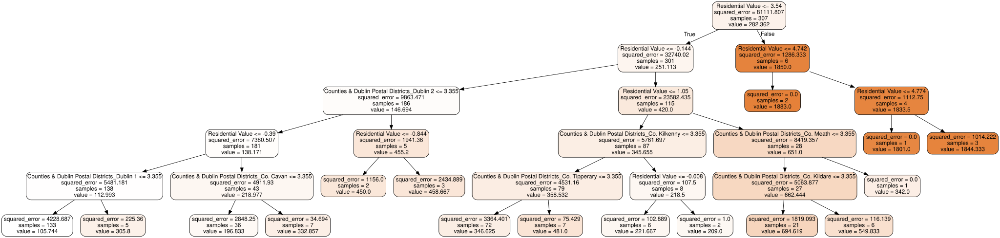

In [198]:
figsize=(5,4)
dot_data = tree.export_graphviz(DTregressor, out_file=None, 
                                feature_names=X.columns,  
                                filled=True, rounded=True)
graphviz.Source(dot_data, format="png") # png


In [199]:
# Printing the predicted values and actual values
results = np.concatenate((y_pred_DT.reshape(len(y_pred_DT),1), y_test.reshape(len(y_test),1)),1)
print(pd.DataFrame(results, columns=['Predicted', 'Actual']))

     Predicted  Actual
0   105.744361   132.0
1   346.625000   335.0
2   196.833333   265.0
3   105.744361    61.0
4   549.833333   568.0
..         ...     ...
72  105.744361   292.0
73  105.744361    13.0
74  481.000000   461.0
75  105.744361    40.0
76  105.744361    63.0

[77 rows x 2 columns]


### 3.3.3 Cross Validation K-Fold CV - DTR

In [200]:
# k-fold CV 
DTregressor = DecisionTreeRegressor(max_depth = 5)
scores = cross_val_score(DTregressor, X_train, y_train, scoring='r2', cv=5)
print(scores)
print("Avg :",np.average(scores))

[0.79144108 0.96960062 0.95013779 0.91262411 0.97466562]
Avg : 0.919693843223801


## 3.4. Random Forest Regressor 

In [201]:
from sklearn.ensemble import RandomForestRegressor
regressor = RandomForestRegressor(n_estimators = 100, random_state = 3)
regressor.fit(X_train, y_train)

RandomForestRegressor(random_state=3)

In [202]:
y_pred_random = regressor.predict(X_test)

In [203]:
#from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error,explained_variance_score
print("R-squared of the model in training set is: {}".format(regressor.score(X_train, y_train)))#0.9981
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(regressor.score(X_test, y_test)))#0.9841
print("Root mean squared error of the prediction is: {}".format(mse(y_test, y_pred_random)**(1/2)))#38.97
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_pred_random) / y_test)) * 100))# 8.24

R-squared of the model in training set is: 0.9972911805233536
-----Test set statistics-----
R-squared of the model in test set is: 0.9801445449932292
Root mean squared error of the prediction is: 43.62437400138618
Mean absolute percentage error of the prediction is: 8.96617998190125


In [204]:
#Accuracy of Random Regression model

from sklearn.metrics import r2_score
r2_score(y_test, y_pred_random) ## 0.9801

0.9801445449932292

In [205]:
# Printing the predicted values and actual values
results = np.concatenate((y_pred_random.reshape(len(y_pred_random),1), y_test.reshape(len(y_test),1)),1)
print(pd.DataFrame(results, columns=['Predicted', 'Actual']))

     Predicted  Actual
0   110.873333   132.0
1   349.280000   335.0
2   279.460000   265.0
3    59.440000    61.0
4   561.140000   568.0
..         ...     ...
72  253.690000   292.0
73   13.752786    13.0
74  542.875000   461.0
75   40.600000    40.0
76   62.569167    63.0

[77 rows x 2 columns]


In [206]:
#import numpy as np
#X_test = pd.DataFrame(X_test, columns=X.columns)
#X_train = pd.DataFrame(X_train, columns=X.columns)

#['Counties & Dublin Postal Districts', 'Residential Value']

### 3.4.1. LIME Interpration - RFR

In [207]:
#feature_names= X.columns
class_nanmes =['imports']

In [208]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=X.columns, verbose=True, mode='regression')

In [209]:
i = 20
exp = explainer.explain_instance(X_test[i], regressor.predict, num_features=5)
exp.show_in_notebook(show_table=True)

exp.as_list()

Intercept 1127.1697143378851
Prediction_local [621.54083718]
Right: 724.927


[('Counties & Dublin Postal Districts_Co. Cork <= -0.15', -648.2607947751677),
 ('Residential Value > 0.41', 461.3692843864036),
 ('Counties & Dublin Postal Districts_Dublin 2 <= -0.15', -158.63154837161045),
 ('Counties & Dublin Postal Districts_Dublin 1 <= -0.15', -85.20268490142494),
 ('Counties & Dublin Postal Districts_Dublin 4 <= -0.15', -74.90313350035436)]

**Discussion**
- The predicted value of the Non Residential Value is 724.93.

- The variable Residential Value has positive influence while Counties & Dublin Postal Districts for Co. Cork, Dublin 2, Dublin 1 and Dublin 4 have negative influence on predicted the Non Residential Electricity Values

- All the values are in gigawatts per hour

### 3.4.2 Cross Validation K-Fold CV - RFR

In [210]:
# K-fold CV 
regressor = RandomForestRegressor(n_estimators = 100, random_state = 3)
scores = cross_val_score(regressor, X_train, y_train, scoring='r2', cv=5)
print(scores)
print("Avg :",np.average(scores))

[0.90808248 0.99443553 0.97870901 0.98347681 0.9950966 ]
Avg : 0.9719600847227771


## 3.5. Gradient Boosting Regressor

In [211]:
from sklearn.ensemble import GradientBoostingRegressor
model= GradientBoostingRegressor(n_estimators=100, 
    learning_rate=0.1, 
    max_depth=3
)
model.fit(X_train, y_train)
#model.score(X_test,y_test)

GradientBoostingRegressor()

In [212]:
y_gradient_pred = model.predict(X_test)

#Accuracy of Random Regression model
from sklearn.metrics import r2_score
r2_score(y_test, y_gradient_pred) ## 0.9731

0.9731710171214469

In [213]:
#from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error,explained_variance_score
print("R-squared of the model in training set is: {}".format(model.score(X_train, y_train)))#0.9981
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(model.score(X_test, y_test)))#0.9841
print("Root mean squared error of the prediction is: {}".format(mse(y_test, y_gradient_pred)**(1/2)))#38.97
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_gradient_pred) / y_test)) * 100))# 8.24

R-squared of the model in training set is: 0.9902422856520371
-----Test set statistics-----
R-squared of the model in test set is: 0.9731710171214469
Root mean squared error of the prediction is: 50.709740751047164
Mean absolute percentage error of the prediction is: 35.091701146809555


In [214]:
# Printing the predicted values and actual values
results = np.concatenate((y_gradient_pred.reshape(len(y_gradient_pred),1), y_test.reshape(len(y_test),1)),1)
print(pd.DataFrame(results, columns=['Predicted', 'Actual']))

     Predicted  Actual
0   107.182564   132.0
1   396.930017   335.0
2   263.795880   265.0
3    85.484917    61.0
4   574.038201   568.0
..         ...     ...
72  217.105780   292.0
73   45.869068    13.0
74  489.117824   461.0
75   72.274379    40.0
76   84.368168    63.0

[77 rows x 2 columns]


### 3.5.1. LIME Interpration - GBR

In [215]:
#feature_names=X.columns
class_names=['Non Residential Value']

In [216]:
#explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=X.columns, class_names=['Non Residential Value'], verbose=True, mode='regression')

In [217]:
i = 20
exp = explainer.explain_instance(X_test[i], model.predict, num_features=5)
exp.show_in_notebook(show_table=True)

exp.as_list()

Intercept 907.2964914549548
Prediction_local [604.9166208]
Right: 718.3223171154499


[('Residential Value > 0.41', 437.02125509285116),
 ('Counties & Dublin Postal Districts_Co. Cork <= -0.15', -306.7078195713432),
 ('Counties & Dublin Postal Districts_Dublin 2 <= -0.15', -226.24671872666156),
 ('Counties & Dublin Postal Districts_Dublin 1 <= -0.15', -129.26704007661613),
 ('Counties & Dublin Postal Districts_Dublin 15 <= -0.15', -77.1795473749303)]

**Discussion**
- The predicted value of the Non Residential Value is 718.32.

- The variable Residential Value has positive influence in the predicition. Whereas Counties & Dublin Postal Districts for Co. Cork, Dublin 2, Dublin 1 and Dublin 4 have negative influence on predicted the Non Residential Electricity Values. The way as features were influencing the predicition of the target value is similar to the ones produced when anylysing RFR.

- All the values are in gigawatts per hour

### 3.5.2. Cross Validation K-fold CV - GBR

In [218]:
# K-fold CV 
model= GradientBoostingRegressor(n_estimators=100, 
    learning_rate=0.1, 
    max_depth=3
)
scores = cross_val_score(model, X_train, y_train, scoring='r2', cv=5)
print(scores)
print("Avg :",np.average(scores))

[0.92891444 0.9897118  0.9803129  0.97858317 0.98522178]
Avg : 0.9725488192217799


## 3.6. Linear Regression

In [219]:
from sklearn.linear_model import LinearRegression,Ridge,Lasso
lrm = LinearRegression()
lrm.fit(X_train, y_train) #fit an OLS model

LinearRegression()

In [220]:
y_preds_train = lrm.predict(X_train)
y_preds_test = lrm.predict(X_test)  #making predictions

In [221]:
# Display the r2 score values
from sklearn.metrics import r2_score
print("Training set score: {:.2f}".format(lrm.score(X_train, y_train)))
print("Test set score: {:.2f}".format(lrm.score(X_test, y_test)))  #1.00 # 0.99

Training set score: 1.00
Test set score: 0.99


In [222]:
y_pred = lrm.predict(X_test)

In [223]:
#Accuracy of the LR model

from sklearn.metrics import r2_score
r2_score(y_test, y_pred) #0.9912

0.9912770542279572

In [224]:
#from statsmodels.tools.eval_measures import mse, rmse
print("R-squared of the model in training set is: {}".format(lrm.score(X_train, y_train))) # 0.9957
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(lrm.score(X_test, y_test))) # 0.9911
print("Root mean squared error of the prediction is: {}".format(rmse(y_test, y_preds_test)))
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_preds_test) / y_test)) * 100))

R-squared of the model in training set is: 0.9957198031119021
-----Test set statistics-----
R-squared of the model in test set is: 0.9912770542279572
Root mean squared error of the prediction is: 28.914845254656264
Mean absolute percentage error of the prediction is: 6.831336599481014


In [225]:
# Printing the predicted values and actual values
results = np.concatenate((y_pred.reshape(len(y_pred),1), y_test.reshape(len(y_test),1)),1)
print(pd.DataFrame(results, columns=['Predicted', 'Actual']))

     Predicted  Actual
0   124.379555   132.0
1   332.476005   335.0
2   306.461335   265.0
3    60.482963    61.0
4   551.457407   568.0
..         ...     ...
72  264.577270   292.0
73   12.958809    13.0
74  474.198779   461.0
75   36.785027    40.0
76   60.705352    63.0

[77 rows x 2 columns]


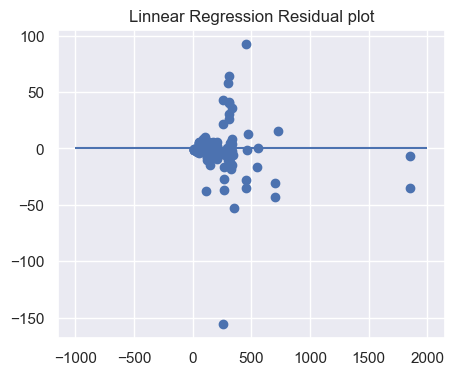

In [226]:
#residual plot
fig, ax = plt.subplots(figsize=(5,4)) 
x_plot = plt.scatter(y_preds_test, (y_preds_test - y_test), c='b')
plt.hlines(y=0, xmin= -1000, xmax=2000)
plt.title('Linnear Regression Residual plot');

### 3.6.1. lime Interpretation - LR

In [227]:
#Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=X.columns, class_names=['Non Residential Value'], verbose=True, mode='regression')

In [228]:
i = 20
exp = explainer.explain_instance(X_test[i], lrm.predict, num_features=5)
exp.show_in_notebook(show_table=True)

exp.as_list()

Intercept 3829.4884055375037
Prediction_local [1000.70646349]
Right: 725.1808237655987


[('Counties & Dublin Postal Districts_Co. Cork <= -0.15', -1865.0100695056653),
 ('Counties & Dublin Postal Districts_Co. Dublin > -0.15', 665.7969389249927),
 ('Counties & Dublin Postal Districts_Co. Limerick <= -0.15',
  -603.2429975205039),
 ('Counties & Dublin Postal Districts_Co. Galway <= -0.15',
  -581.9905166068864),
 ('Counties & Dublin Postal Districts_Co. Kildare <= -0.15',
  -444.3352973399873)]

**Discussion**
- The predicted value of the Non Residential Value is 725.18.

- The variable Counties & Dublin Postal Districts Co. Dublin has a negative influence, whereas Counties & Dublin Postal Districts for Co. Cork, Co. Galway, Co. Limerick and Co. Kildare have a positive influence on predicted the Non Residential Electricity Values

- All the values are in gigawatts per hour

### 3.6.2. Cross Validation K-fold CV - LR

In [229]:
# k-fold CV
lrm = LinearRegression()
scores = cross_val_score(lrm, X_train, y_train, scoring='r2', cv=5)
print(scores)
print("Avg :",np.average(scores))

[0.98045433 0.99396193 0.99625972 0.9945954  0.99702214]
Avg : 0.9924587010524075


## 3.7. Ridge Regression

In [230]:
# Using GridSearch for parameter optimization
ridgeregr = GridSearchCV(Ridge(),
                    param_grid={
                        'alpha': [10] # 0.01, 0.1, 10
                    }, verbose=1)

ridgeregr.fit(X_train, y_train)

ridge = ridgeregr.best_estimator_

Fitting 5 folds for each of 1 candidates, totalling 5 fits


In [231]:
# Making predictions here
y_preds_train = ridge.predict(X_train)
y_preds_test_ridge = ridge.predict(X_test)

print("R-squared of the model in training set is: {}".format(ridge.score(X_train, y_train)))#0.9935
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(ridge.score(X_test, y_test)))#0.9887
print("Root mean squared error of the prediction is: {}".format(mse(y_test, y_preds_test_ridge)**(1/2)))# 42.93
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_preds_test_ridge) / y_test)) * 100))

R-squared of the model in training set is: 0.9935382213772096
-----Test set statistics-----
R-squared of the model in test set is: 0.9887252493551958
Root mean squared error of the prediction is: 32.873258811001655
Mean absolute percentage error of the prediction is: 10.434071704454036


In [232]:
# Display the r2 score values
from sklearn.metrics import r2_score
print("Training set score: {:.2f}".format(ridge.score(X_train, y_train)))#0.99
print("Test set score: {:.2f}".format(ridge.score(X_test, y_test)))#0.98

Training set score: 0.99
Test set score: 0.99


In [233]:
# Printing the predicted values and actual values
results = np.concatenate((y_preds_test_ridge.reshape(len(y_preds_test_ridge),1), y_test.reshape(len(y_test),1)),1)
print(pd.DataFrame(results, columns=['Predicted', 'Actual']))

     Predicted  Actual
0   123.618125   132.0
1   370.724758   335.0
2   311.334005   265.0
3    61.383137    61.0
4   540.747270   568.0
..         ...     ...
72  261.999746   292.0
73   17.715725    13.0
74  495.683797   461.0
75   43.923345    40.0
76   65.314478    63.0

[77 rows x 2 columns]


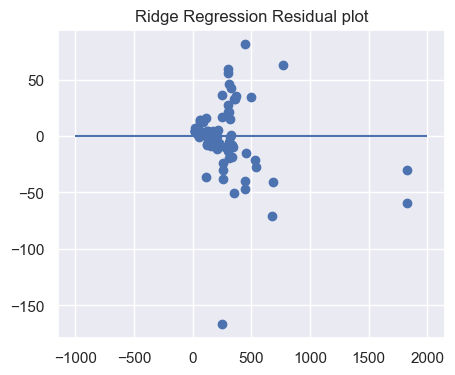

In [234]:
#Ridge Reegression residual plot
fig, ax = plt.subplots(figsize=(5,4)) 
x_plot = plt.scatter(y_preds_test_ridge, (y_preds_test_ridge - y_test), c='b')
plt.hlines(y=0, xmin= -1000, xmax=2000)
plt.title('Ridge Regression Residual plot');

### 3.7.1. Lime Interpretation - RR

In [235]:
#explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=X.columns, class_names=['Non Residential Value'], verbose=True, mode='regression')

In [236]:
i = 20
exp = explainer.explain_instance(X_test[i], ridgeregr.predict, num_features=5)
exp.show_in_notebook(show_table=True)

exp.as_list()

Intercept 1747.938558901319
Prediction_local [715.97736368]
Right: 773.0065701775038


[('Counties & Dublin Postal Districts_Co. Cork <= -0.15', -934.6649000280996),
 ('Counties & Dublin Postal Districts_Dublin 2 <= -0.15', -297.735661754115),
 ('Counties & Dublin Postal Districts_Co. Limerick <= -0.15',
  -286.51579629007205),
 ('Residential Value > 0.41', 275.28136198355577),
 ('Counties & Dublin Postal Districts_Co. Dublin > -0.15', 211.6738008674473)]

**Discussion**

-The predicted value of the Non Residential Value is 773.01.

-The variables Counties & Dublin Postal Districts Co. Cork, Dublin 2 and Co. Limerick have a negative influence, whereas Residential Value, Counties & Dublin Postal Districts for Co. Dublin have a positive influence on predicted the Non Residential Electricity Values

-All the values are in gigawatts per hour

In [237]:
# Printing the predicted values and actual values
#results = np.concatenate((y_gradient_pred.reshape(len(y_gradient_pred),1), y_test.reshape(len(y_test),1)),1)
#print(pd.DataFrame(results, columns=['Predicted', 'Actual']))

## 3.8. Lasso Regression

In [238]:
# using GridSearch for parameter optimization
lassoregr = GridSearchCV(Lasso(),
                    param_grid={
                        'alpha': [10] # 0.01, 0.1, 10
                    }, verbose=1)

lassoregr.fit(X_train, y_train)

lasso = lassoregr.best_estimator_

Fitting 5 folds for each of 1 candidates, totalling 5 fits


In [239]:
# We are making predictions here
y_preds_train = lasso.predict(X_train)
y_preds_test_lasso = lasso.predict(X_test)

print("R-squared of the model in training set is: {}".format(lasso.score(X_train, y_train)))#0.9624
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(lasso.score(X_test, y_test)))#0.9451
print("Root mean squared error of the prediction is: {}".format(rmse(y_test, y_preds_test_lasso)))# 63.21
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_preds_test_lasso) / y_test)) * 100))#42.13

R-squared of the model in training set is: 0.962463240020692
-----Test set statistics-----
R-squared of the model in test set is: 0.9451471189726435
Root mean squared error of the prediction is: 72.50851447024257
Mean absolute percentage error of the prediction is: 62.04104874908196


In [240]:
# Display the r2 score values
from sklearn.metrics import r2_score
print("Training set score: {:.2f}".format(lasso.score(X_train, y_train)))#0.96
print("Test set score: {:.2f}".format(lasso.score(X_test, y_test)))#0.95

Training set score: 0.96
Test set score: 0.95


In [241]:
# Printing the predicted values and actual values
results = np.concatenate((y_preds_test_lasso.reshape(len(y_preds_test_lasso),1), y_test.reshape(len(y_test),1)),1)
print(pd.DataFrame(results, columns=['Predicted', 'Actual']))

     Predicted  Actual
0   136.198090   132.0
1   443.698757   335.0
2   231.395990   265.0
3   108.020738    61.0
4   508.629176   568.0
..         ...     ...
72  178.085049   292.0
73   55.341341    13.0
74  468.200802   461.0
75  109.245841    40.0
76  125.172170    63.0

[77 rows x 2 columns]


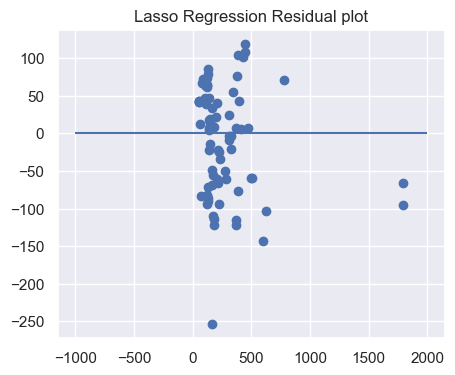

In [242]:
#Lasso Reegression residual plot
fig, ax = plt.subplots(figsize=(5,4)) 
x_plot = plt.scatter(y_preds_test_lasso, (y_preds_test_lasso - y_test), c='b')
plt.hlines(y=0, xmin= -1000, xmax=2000)
plt.title('Lasso Regression Residual plot');

### 3.8.1. Lime Interpration - LAR

In [243]:
#explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=X.columns, class_names=['Non Residential Value'], verbose=True, mode='regression')

In [244]:
i = 20
exp = explainer.explain_instance(X_test[i], lassoregr.predict, num_features=5)
exp.show_in_notebook(show_table=True)

exp.as_list()

Intercept 1233.1726474117459
Prediction_local [654.68911603]
Right: 780.6018770431983


[('Counties & Dublin Postal Districts_Co. Cork <= -0.15', -496.9680408935702),
 ('Residential Value > 0.41', 456.7986181352089),
 ('Counties & Dublin Postal Districts_Dublin 2 <= -0.15', -278.57434816969595),
 ('Counties & Dublin Postal Districts_Co. Limerick <= -0.15',
  -140.63839529392223),
 ('Counties & Dublin Postal Districts_Dublin 15 <= -0.15',
  -119.10136516361054)]

**Discussion**

-The predicted value of the Non Residential Value is 780.60.

-The variables Counties & Dublin Postal Districts Co. Cork, Dublin 2, Co. Limerick and Dublin 15 have a negative influence, whereas Residential Value has a positive influence on predicted the Non Residential Electricity Values.

-All the values are in gigawatts per hour.

## 3.9 Final Discussion after the metrics evaluation.

Through the application of the 6 ML models for regression, it was possible to predict the Non Residential target variable. Ensemble models demonstrate their potential to manage tabular data with linear relation that to generalize well when tested in a new data sample. After evaluating the Non-Residential clients RFR and GBR could be recommended. Both had a very good balance between training and testing performance, GBR produced a R² score the training set of **0.9902** and testing set **0.9731**, similarly RFR had a R² score for training set 0.9972 and testing set 0.9801. Also, RFR and GBR produced a RMSE of 43.62 and 50.70 and MAPE of 8.96 and 35.09 individually. Hence, they could be a reliable choice for deployment as they could generalize well on a new dataset. From the cross-validation perspective, RFR and GBR models demonstrated that they are more robust and consistent across different data subsets with average scored of 0.9719 and 0.9725 respectively. 

### 3.9. DTR and LR Visualizations

### 3.9.1. DTR Visualization 

In [245]:
# Method or Function for Linear Regression plot
def lin_regplot(X, y, model):
    plt.scatter(X, y, c = 'blue')
    plt.plot(X, model.predict(X), color = 'red', linewidth = 2)    
    return

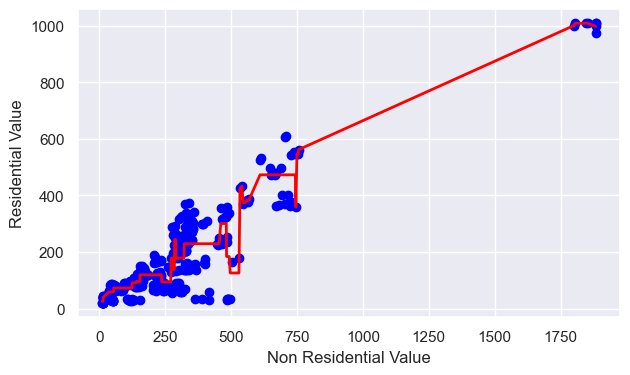

In [246]:
# import DecisionTreeRegressor from the sklearn library
from sklearn.tree import DecisionTreeRegressor

# Store the feature or attribute values in X and y
X = Meters_new[['Non Residential Value']].values
y = Meters_new[['Residential Value']].values

# Initialise an object by calling a method DecisionTreeRegressor()
tree = DecisionTreeRegressor(max_depth = 5)
tree.fit(X, y)

# Return a copy of the array collapsed into one dimension.
fig, ax = plt.subplots(figsize=(7,4)) 
sort_idx = X.flatten().argsort()

lin_regplot(X[sort_idx], y[sort_idx], tree)
plt.xlabel('Non Residential Value')
plt.ylabel('Residential Value')
#plt.savefig('./figures/tree_regression.png', dpi = 300)
plt.show()

### 3.9.2. Linear Regression Visualization - Linear Data relation

In [247]:
# Method or Function for Linear Regression plot
def lin_regplot(X, y, model):
    plt.scatter(X, y, c = 'blue')
    plt.plot(X, model.predict(X), color = 'red', linewidth = 2)    
    return

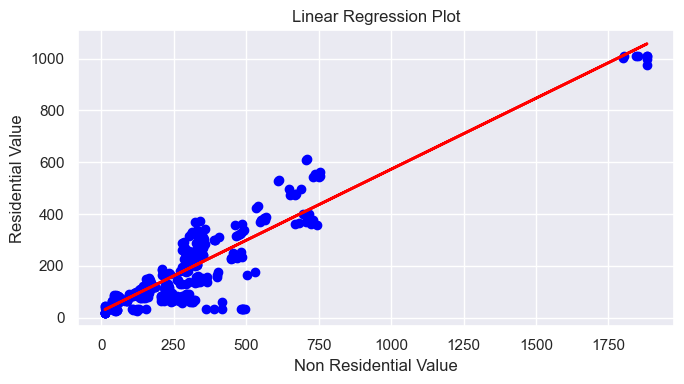

In [248]:
# Display the regression plot using lin_regplot() method

# Store the feature or attribute values in X and y
X = Meters_new[['Non Residential Value']].values
y = Meters_new[['Residential Value']].values

lrm.fit(X, y)

# Return a copy of the array collapsed into one dimension.
fig, ax = plt.subplots(figsize=(7,4)) 
sort_idx = X.flatten().argsort()

lin_regplot(X, y, lrm)
plt.title('Linear Regression Plot')
plt.xlabel('Non Residential Value')
plt.ylabel('Residential Value')
plt.tight_layout()
plt.show()

### 3.9.3. K-Means Clustering.

The cluster below were not referenced in the report. It was enrich by using a Geo space visualization in Tableau.

In [249]:
X1 = Meters_new.loc[:, ['Non Residential Value', 'Residential Value']] # independent variables

In [250]:
#X1

In [251]:
#X1 = Meters.iloc[:, [0,1]].values # [:, [0:2]] or [:,[0,-1]]

32281790.4140625
12074629.875
4172577.0444959076
1499997.9652429468
921253.4161852261
456107.90869164513
297155.8610344054
229686.1585637305
182003.4441696697
146855.66764964056


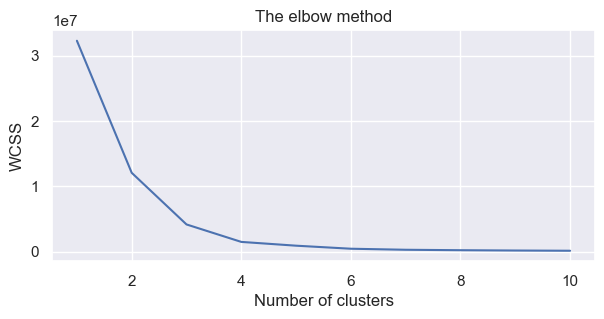

In [252]:
# Finding the optimum number of clusters for k-means classification
from sklearn.cluster import KMeans
wcss = []                  # Declare an array

# Set the loop from the minimum and maximum values
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)
    print(kmeans.inertia_)
# inertia_float: Sum of squared distances of samples to their closest cluster center.

# Plotting the results onto a line graph, allowing us to observe 'The elbow'
fig, ax = plt.subplots(figsize=(7,3)) 
plt.plot(range(1, 11), wcss)
plt.title('The elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')    # within cluster sum of squares
plt.show()

In [253]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters = 3, max_iter = 300, n_init = 10, random_state = 0)
kmeans.fit(X1)

KMeans(n_clusters=3, n_init=10, random_state=0)

In [254]:
# n_initint, default = 10, Number of time the k-means algorithm will be run with different centroid seeds. 
# The final results will be the best output of n_init consecutive runs in terms of inertia.
y_kmeans = kmeans.fit_predict(X1)
#print(y_kmeans)

<Axes: xlabel='Non Residential Value', ylabel='Residential Value'>

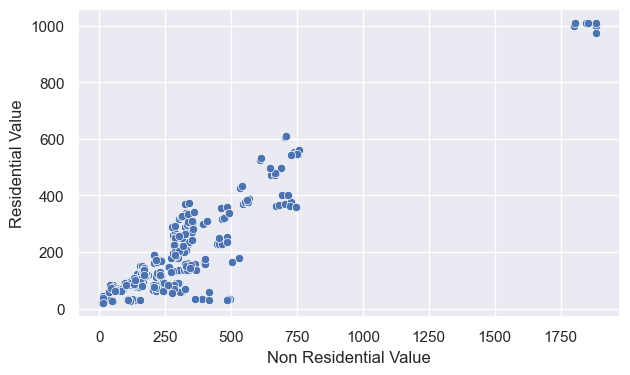

In [255]:
fig, ax = plt.subplots(figsize=(7,4)) 
sns.scatterplot(data = Meters_new, x = 'Non Residential Value', y = 'Residential Value')

<Axes: xlabel='Non Residential Value', ylabel='Residential Value'>

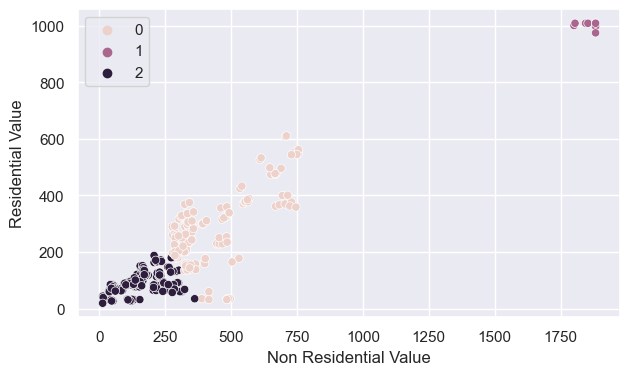

In [256]:
fig, ax = plt.subplots(figsize=(7,4)) 
sns.scatterplot(data = Meters_new, x = 'Non Residential Value', y = 'Residential Value', hue = kmeans.labels_)

**References**

https://data.cso.ie/table/MEC03  

https://data.cso.ie/

https://www.cso.ie/en/releasesandpublications/ep/p-dcmec/datacentresmeteredelectricityconsumption2022/keyfindings/#:~:text=Electricity%20consumption%20by%20data%20centres%20increased%20by%2031%25%20between%202021,2015%20to%2018%25%20in%202022. 

https://www.analyticsvidhya.com/blog/2020/07/what-is-skewness-statistics/

https://www.corkcity.ie/en/doing-business-in-cork/economic-profile/economic-monitor/#:~:text=In%20total%2C%20the%20multinational%20sector,and%20300%20ICT%20related%20companies.

https://www.analyticsvidhya.com/blog/2017/06/a-comprehensive-guide-for-linear-ridge-and-lasso-regression/

https://towardsdatascience.com/evaluation-metrics-model-selection-in-linear-regression-73c7573208be#:~:text=Mean%20Squared%20Error%20(MSE),it%20is%20easier%20to%20optimize.

https://www.analyticsvidhya.com/blog/2021/05/know-the-best-evaluation-metrics-for-your-regression-model/

https://www.embedded-robotics.com/regression-modelling/

https://scikit-learn.org/stable/modules/cross_validation.html

https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.cross_validate.html

https://scikit-learn.org/stable/modules/cross_validation.html

https://www.frontiersin.org/articles/10.3389/fmtec.2022.855208/full#B16

https://pub.aimind.so/winsorizing-a-balancing-act-in-statistical-analysis-d4d78dffc9c8

https://www.analyticsvidhya.com/blog/2018/06/comprehensive-guide-for-ensemble-models/

https://www.analyticsvidhya.com/blog/2021/08/a-walk-through-of-regression-analysis-using-artificial-neural-networks-in-tensorflow/

https://www.corkcity.ie/en/doing-business-in-cork/economic-profile/economic-monitor/ 